# Úvod

![mood](https://miro.medium.com/v2/resize:fit:518/format:webp/1*iEkoBTURLU8t2NYeOPTIYw.jpeg)

Vybral jsem si dataset **Action-Camera Parking Dataset** ([ACPDS](https://arxiv.org/abs/2107.12207)). Tento dataset je
zaměřen na detekci obsazenosti parkovacích míst a byl vytvořen s cílem poskytnout různorodé a realistické snímky
parkovišť a ulic na rozdíl od statických kamerových systémů.

Pro vytvoření datové sady ACPDS autoři použili kameru _GoPro Hero 6_, kterou připevnili na **12 metrů** dlouhou
teleskopickou tyč. Tímto způsobem získali možnost zachytit různá parkoviště a ulice z jedinečných pohledů, které
klasické přístupy monitorování nemohou poskytnout.

Fotografie byly pořízeny z výšky již zmíněných 12 metrů, což odpovídá běžné výšce pouličních lamp. Tato vlastnost je
velmi důležitá pro praktické použití, protože fotografie budou lépe odrážet reálné situace, které mohou nastat. Celkově
autoři zachytili 293 snímků v rozlišení **4000x3000** pixelů.

Snímky parkovišť a ulic přináší spousty výzev, jako jsou různé úhly pohledu, různé osvětlení a stíny, překážející
objekty a různé povrchy vozovky. Tyto výzvy jsou jedním z důvodů, proč dataset vznikl.

[Odkaz](https://github.com/martin-marek/parking-space-occupancy) na GitHub repozitář autorů s všemi potřebnými
informacemi a soubory.


# Načtení knihoven 📚🐍


In [ ]:
import io
import os
import random
import zipfile
import time
from datetime import timedelta

import requests
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import tqdm
import cv2

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
from torchinfo import summary
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# Nastavení náhodného prostředí pro reprodukovatelnost 🎲🔄


In [2]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Kontrola dostupnosti GPU 🖥️⚡


In [3]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    print(f"Using device: {device}")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    device = torch.device('cpu')
    print(f"Using device: {device}")

Using device: cuda
GPU: NVIDIA GeForce RTX 2070


# Stažení a načtení dat 📥


In [4]:
dataset_dir = 'data/parking_dataset'
download_url = 'https://pub-e8bbdcbe8f6243b2a9933704a9b1d8bc.r2.dev/parking%2Frois_gopro.zip'

In [5]:
if not os.path.exists(dataset_dir):
    os.makedirs(dataset_dir)
    with requests.get(download_url, stream=True) as response:
        response.raise_for_status()
        total_size = int(response.headers.get('content-length', 0))
        block_size = 1024  # 1 Kibibyte
        t = tqdm.tqdm(
            total=total_size, unit='iB', unit_scale=True,
            desc="Downloading dataset",
            bar_format="{desc}: {percentage:3.0f}%|{bar:30}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}]",
            colour="#4CAF50"  # Green color for download
        )
        buffer = io.BytesIO()
        for data in response.iter_content(block_size):
            t.update(len(data))
            buffer.write(data)
        t.close()
        if total_size != 0 and t.n != total_size:
            print("ERROR, something went wrong")
        buffer.seek(0)
        zip = zipfile.ZipFile(buffer)

    print('Extracting files...')
    extraction_progress = tqdm.tqdm(
        zip.namelist(),
        desc="Extracting files",
        bar_format="{desc}: {percentage:3.0f}%|{bar:30}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}]",
        colour="#E91E63"  # Pink color for extraction
    )
    for file in extraction_progress:
        zip.extract(file, dataset_dir)
    print('✓ Data downloaded and extracted successfully')
else:
    print('✓ Data already exists')

✓ Data already exists


In [6]:
print(os.listdir(dataset_dir))

['annotations.json', 'images']


Stažený zip archiv obsahuje následující složky a soubory:

- `images` - složka obsahující fotografie parkovišť
- `annotations.json` - soubor obsahující anotace k fotografiím k jednotlivým parkovištím

Pojďme se na ně podívat.


# Fotografie parkovišť 📸🅿️

Jednotlivé snímky jsou uloženy ve složce `images`. Nyní si zobrazíme několik z nich.


In [7]:
images_dir = os.path.join(dataset_dir, 'images')

In [8]:
def load_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Image not found at path: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

In [9]:
len(os.listdir(images_dir))

293

Dostáváme přesně stejný počet snímků, jaký byl zmíněn autory v datasetu. Paráda! ✅🎉


## Vizualizace snímků 🖼️🔍


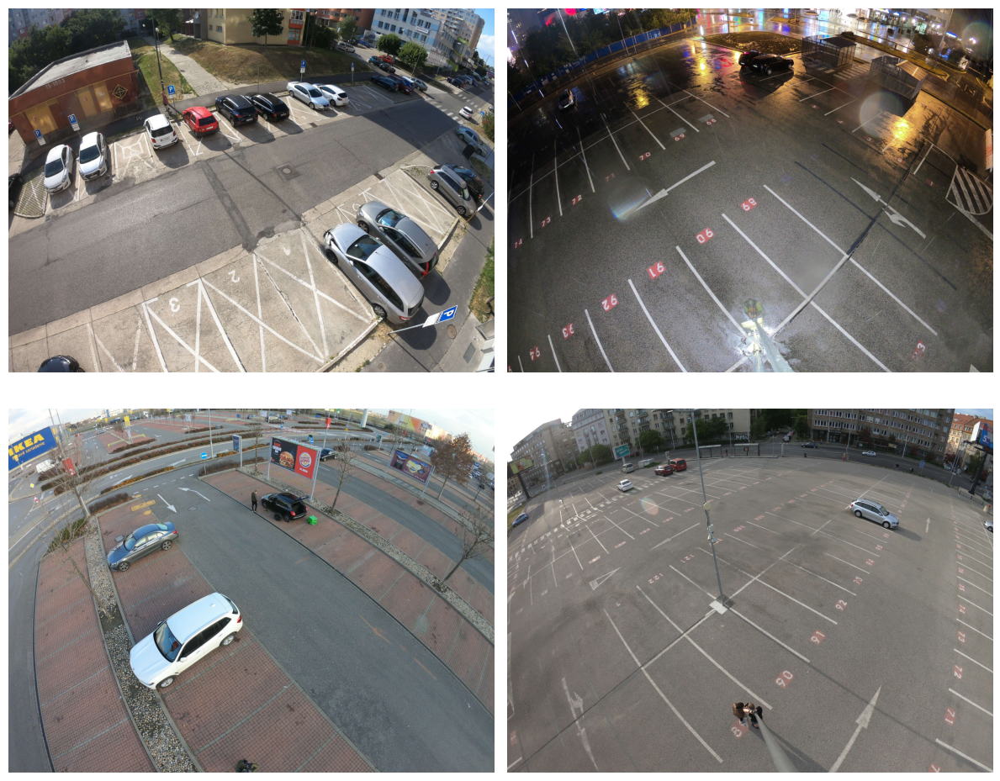

In [10]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

random_images = random.sample(os.listdir(images_dir), 4)

for i, img_name in enumerate(random_images):
    image_path = os.path.join(images_dir, img_name)
    image = load_image(image_path)
    axes[i].imshow(image)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Jsou to převážně parkoviště u obchodů, která jsou vidět zhruba z výšky zmíněných 12 metrů. Jsou mírně rozostřené ptačí
perspektivou, ale stále je možné rozpoznat jednotlivá auta. Koneckonců, to je hlavní cíl tohoto datasetu, mít pestré a
reálné data. Jednotlivá místa jsou označena pomocí anotací s tímto mírným rozostřením.


# Anotace 📝✍️


Anotace jsou klíčovou součástí datasetu, která umožňuje identifikaci a klasifikaci parkovacích míst. 📌

Bez těchto anotací by nebylo možné efektivně trénovat modely pro detekci obsazenosti parkovacích míst. Anotace jsou
uloženy v souboru `annotations.json` a budeme je používat k extrakci výřezů parkovacích míst a jejich příslušných stavů
obsazenosti pro účely trénování a testování modelu. 🗂️


In [11]:
json_annotations = pd.read_json(os.path.join(dataset_dir, 'annotations.json'))
json_annotations.head()

,train,valid,test
file_names,"[GOPR0025.JPG, GOPR6545.JPG, GOPR0031.JPG, GOP...","[GOPR6590.JPG, GOPR6593.JPG, GOPR6596.JPG, GOP...","[GOPR6543.JPG, GOPR6538.JPG, GOPR6536.JPG, GOP..."
rois_list,"[[[[0.3330645, 0.518279666666666], [0.2903225,...","[[[[0.8079095, 0.998430666666666], [0.6694915,...","[[[[0.04382425, 0.7564296666666661], [0.0, 0.8..."
occupancy_list,"[[True, True, True, False, True, True, True, T...","[[False, False, False, True, False, True, Fals...","[[False, False, False, False, False, False, Fa..."


In [12]:
print("\nColumns:", json_annotations.columns.tolist())
print("\nIndex:", json_annotations.index.tolist())

for column in json_annotations.columns:
    print(f"\n{column}:")
    for idx in json_annotations.index:
        data = json_annotations.loc[idx, column]
        print(f"\t{idx}: {len(data)} items")
        if len(data) > 0 and isinstance(data[0], list):
            print(f"\t\tFirst item contains {len(data[0])} elements")


Columns: ['train', 'valid', 'test']

Index: ['file_names', 'rois_list', 'occupancy_list']

train:
	file_names: 231 items
	rois_list: 231 items
		First item contains 13 elements
	occupancy_list: 231 items
		First item contains 13 elements

valid:
	file_names: 35 items
	rois_list: 35 items
		First item contains 69 elements
	occupancy_list: 35 items
		First item contains 69 elements

test:
	file_names: 27 items
	rois_list: 27 items
		First item contains 76 elements
	occupancy_list: 27 items
		First item contains 76 elements


Zde vidíme, že anotace obsahují následující informace 📝🔍:

- **📁 rozdělení dat** - data o tom, zda je fotografie součástí trénovacího, validačního nebo testovacího datasetu, zde je
  důležité podotknout, že všechny data jsou uložená v listu přes který budeme přistupovat iterativně skrze indexy
  - **🖼️ názvy souborů** - názvy fotografií, které jsou součástí dané množiny dat
  - **🧭 Souřadnice oblastí zájmu (ROI)** - polygony definující hranice jednotlivých parkovacích míst
  - **🚗 Stav obsazenosti** - informace, zda je místo obsazené (`True`) nebo volné (`False`)


## Vizualizace anotací na fotografii 🖼️🔲


Selected file: GOPR6583.JPG
Number of parking spaces: 18
Occupied spaces: 15
Free spaces: 3


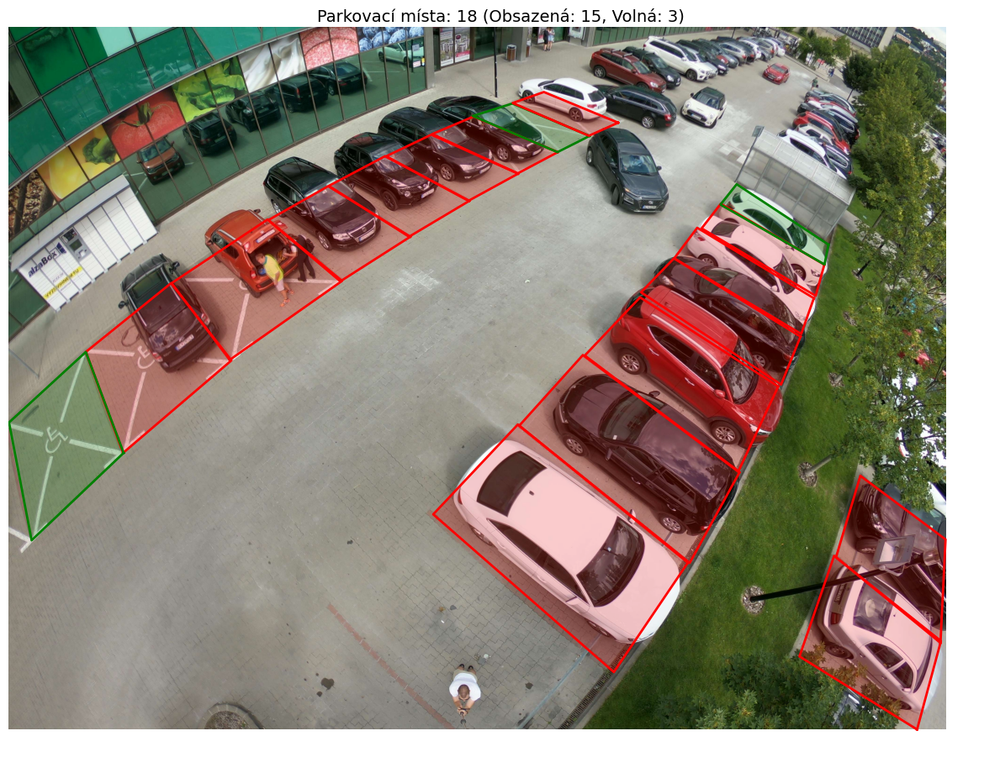

In [13]:
random_pick_file = random.choice(json_annotations['train']['file_names'])
print(f"Selected file: {random_pick_file}")

idx = json_annotations['train']['file_names'].index(random_pick_file)
rois = json_annotations['train']['rois_list'][idx]
occupancy = json_annotations['train']['occupancy_list'][idx]

print(f"Number of parking spaces: {len(occupancy)}")
print(f"Occupied spaces: {occupancy.count(True)}")
print(f"Free spaces: {occupancy.count(False)}")

image_path = os.path.join(images_dir, random_pick_file)
image = load_image(image_path)

plt.figure(figsize=(12, 10))
plt.imshow(image)

for i in range(len(rois)):
    roi = np.array(rois[i])
    is_occupied = occupancy[i]
    edge_color = 'red' if is_occupied else 'green'
    fill_color = ('red' if is_occupied else 'green', 0.2)  # transparency

    # Scale the ROI coordinates to match the image size
    x = roi[:, 0] * image.shape[1]
    y = roi[:, 1] * image.shape[0]

    plt.plot(np.append(x, x[0]), np.append(y, y[0]), color=edge_color, linewidth=2)
    plt.fill(x, y, color=fill_color)

plt.axis('off')
plt.title(f"Parkovací místa: {len(occupancy)} (Obsazená: {occupancy.count(True)}, Volná: {occupancy.count(False)})",
          fontsize=14)
plt.tight_layout()
plt.show()

Často se stává, že parkovací místo označené jako volné, což je pravda, ale je překryté jiným vozidlem. To je jen jedna z
možných situací a překážek, které se mohou vyskytnout při detekci obsazenosti.


## Získání výřezů jednotlivých míst z fotografií 📸🔪


In [14]:
def cut_rois(image, rois):
    roi_images = []
    for roi in rois:
        roi_np = np.array(roi)

        x_min = int(min(roi_np[:, 0]) * image.shape[1])
        y_min = int(min(roi_np[:, 1]) * image.shape[0])
        x_max = int(max(roi_np[:, 0]) * image.shape[1])
        y_max = int(max(roi_np[:, 1]) * image.shape[0])

        roi_image = image[y_min:y_max, x_min:x_max]
        roi_images.append(roi_image)

    return roi_images

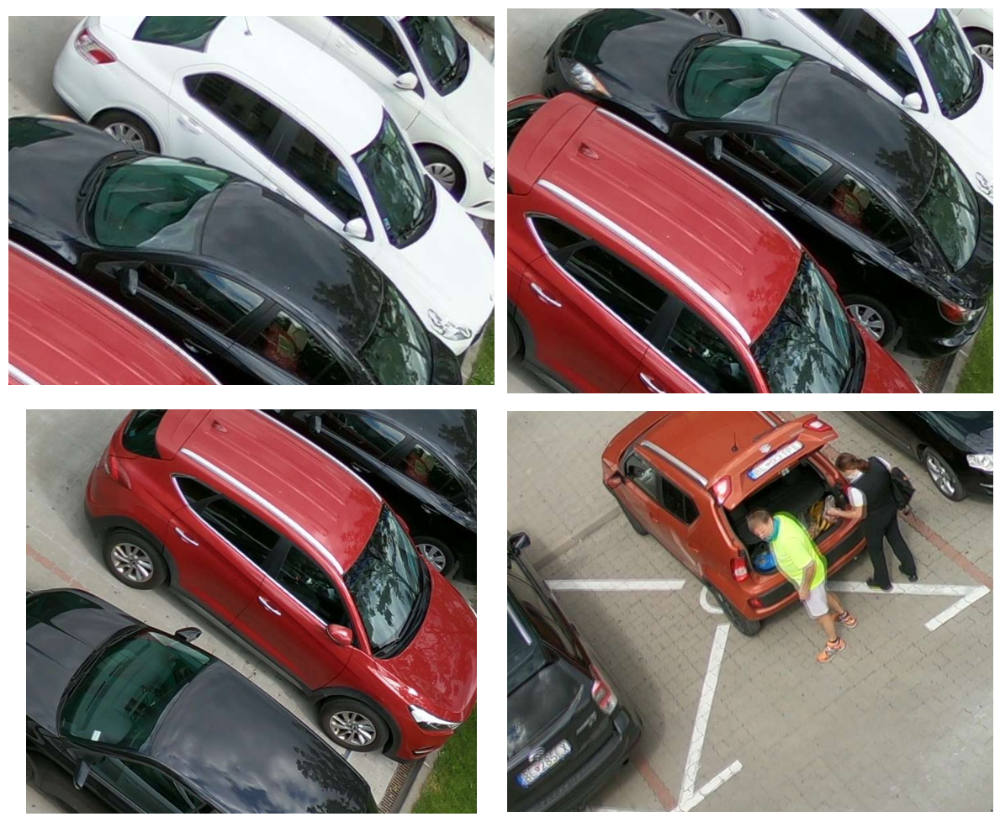

In [15]:
roi_images = cut_rois(image, rois)
random_choices = random.sample(range(len(roi_images)), 4)
selected_roi_images = [roi_images[i] for i in random_choices]

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i in range(4):
    axes[i].imshow(selected_roi_images[i])
    axes[i].axis('off')

plt.tight_layout()
plt.show()

Vidíme, že jednotlivé výřezy mají různé velikosti a tvary. Pojďme se na ně podívat. 🔍


# Získání statistik o výřezech 📊🔍


In [16]:
def analyze_dataset(annotations, images_dir):
    dimensions = {'train': [], 'valid': [], 'test': []}
    total_rois = {}
    class_balance = {}

    for split in ['train', 'valid', 'test']:
        all_heights = []
        all_widths = []

        rois_count = sum(len(rois) for rois in annotations[split]['rois_list'])
        total_rois[split] = rois_count

        occupied = 0
        for idx, file_name in enumerate(annotations[split]['file_names']):
            occupancy_list = annotations[split]['occupancy_list'][idx]
            occupied += occupancy_list.count(True)

            image_path = os.path.join(images_dir, file_name)
            image = load_image(image_path)
            rois = annotations[split]['rois_list'][idx]

            roi_images = cut_rois(image, rois)

            for roi in roi_images:
                all_heights.append(roi.shape[0])
                all_widths.append(roi.shape[1])

        dimensions[split] = {
            'avg_height': np.mean(all_heights) if all_heights else 0,
            'avg_width': np.mean(all_widths) if all_widths else 0,
            'std_height': np.std(all_heights) if all_heights else 0,
            'std_width': np.std(all_widths) if all_widths else 0,
            'min_height': min(all_heights) if all_heights else 0,
            'max_height': max(all_heights) if all_heights else 0,
            'min_width': min(all_widths) if all_widths else 0,
            'max_width': max(all_widths) if all_widths else 0
        }

        unoccupied = rois_count - occupied
        class_balance[split] = {
            'occupied': occupied,
            'unoccupied': unoccupied,
            'occupied_percentage': (occupied / rois_count) * 100 if rois_count > 0 else 0,
            'unoccupied_percentage': (unoccupied / rois_count) * 100 if rois_count > 0 else 0
        }

    total_roi_count = sum(total_rois.values())
    split_percentages = {}
    for split, count in total_rois.items():
        split_percentages[split] = (count / total_roi_count) * 100

    return {
        'dimensions': dimensions,
        'total_rois': total_rois,
        'total_roi_count': total_roi_count,
        'split_percentages': split_percentages,
        'class_balance': class_balance
    }

In [17]:
roi_stats = analyze_dataset(json_annotations, images_dir)

## Rozměry výřezů 📏

Jak jsme si ukázali, výřezy mají různé rozměry. Pro model musíme nastavit uniformní rozměry, abychom mohli použít
konvoluční neuronové sítě. 

 Pojďme se podívat, jaké rozměry mají jednotlivé výřezy a jak je můžeme upravit. 🔍⚙️


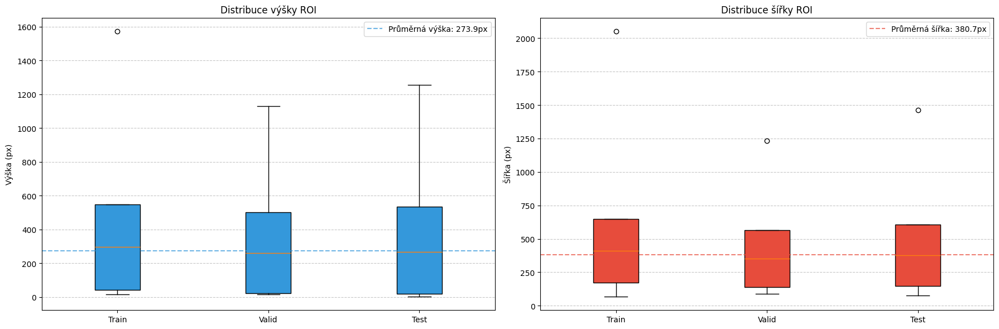

In [18]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))
dimensions = roi_stats['dimensions']
labels = list(dimensions.keys())

height_data = [[dimensions[split]['min_height'],
                dimensions[split]['avg_height'] - dimensions[split]['std_height'],
                dimensions[split]['avg_height'],
                dimensions[split]['avg_height'] + dimensions[split]['std_height'],
                dimensions[split]['max_height']] for split in labels]

bplot1 = ax1.boxplot(height_data, patch_artist=True)
for patch in bplot1['boxes']:
    patch.set_facecolor('#3498db')

avg_height = np.mean([dimensions[split]['avg_height'] for split in labels])
ax1.axhline(y=avg_height, color='#3498db', linestyle='--', alpha=0.7,
            label=f'Průměrná výška: {avg_height:.1f}px')

ax1.set_ylabel('Výška (px)')
ax1.set_title('Distribuce výšky ROI')
ax1.set_xticklabels([s.capitalize() for s in labels])
ax1.grid(axis='y', linestyle='--', alpha=0.7)
ax1.legend()

width_data = [[dimensions[split]['min_width'],
               dimensions[split]['avg_width'] - dimensions[split]['std_width'],
               dimensions[split]['avg_width'],
               dimensions[split]['avg_width'] + dimensions[split]['std_width'],
               dimensions[split]['max_width']] for split in labels]

bplot2 = ax2.boxplot(width_data, patch_artist=True)
for patch in bplot2['boxes']:
    patch.set_facecolor('#e74c3c')

avg_width = np.mean([dimensions[split]['avg_width'] for split in labels])
ax2.axhline(y=avg_width, color='#e74c3c', linestyle='--', alpha=0.7,
            label=f'Průměrná šířka: {avg_width:.1f}px')

ax2.set_ylabel('Šířka (px)')
ax2.set_title('Distribuce šířky ROI')
ax2.set_xticklabels([s.capitalize() for s in labels])
ax2.grid(axis='y', linestyle='--', alpha=0.7)
ax2.legend()

plt.tight_layout()
plt.show()

Vidíme, že každá z daných sad obsahuje **jedno odlehlé pozorování**📉. Může jít o chybný snímek, nesprávnou anotaci nebo záměr
autora.

Vzhledem k tomu, že máme k dispozici pouze 293 snímků, je žádoucí využít **maximum** dostupných dat pro trénink modelu. 💡

Domnívám se, že přítomnost těchto odlehlých snímků je záměrná – autor mohl chtít, aby se model naučil rozpoznávat i méně
kvalitní či **problematické** případy. Tomuto záměru napovídá i skutečnost, že v každé sadě se vyskytuje právě jedno takové
pozorování. 


### Úvaha nad rozměry pro model 🤔

Pravidlo pro velikosti výřezů je jednoduché - čím větší rozměr, tím více detailů a informací model získá. Na druhou
stranu, čím větší rozměr, tím více výpočetní náročnosti a paměti model potřebuje. Je tedy potřeba najít kompromis mezi
těmito dvěma faktory. ⚖️

Pravidlo palce je použít stejné rozměry násobků **32**.

Na výběr máme několik možností:

- **224x224** - standardní velikost pro modely jako ResNet, VGG, EfficientNet - je to de facto standard pro CNN, je zde
  dobrý poměr mezi výpočetní náročností a kvalitou. 
- **256x256** - mírně vyšší rozlišení, které může zachovat více detailů, ale stále je výpočetně efektivní. 
- **320x320** - vhodné pro modely, kde je potřeba zachovat více informací, především pokud jsou parkovací místa menší a
  detailnější.  

Pokud se podíváme na průměrnou výšku a šířku výřezů, možná se nám podaří najít nějaký kompromis. 📏
 

In [19]:
print(f"Průměrná výška: {avg_height:.1f}px")
print(f"Průměrná šířka: {avg_width:.1f}px")

Průměrná výška: 273.9px
Průměrná šířka: 380.7px


Není to úplně košer, ale pokud vemene průměrnou výšku a šířku a získáme jejich průměr, dostaneme se na potenciální
rozměr. (Předem se omlouvám 🙈)


In [20]:
avg_size = (avg_height + avg_width) / 2
print(f"Average dimension (height + width) / 2: {avg_size:.1f} pixels")

Average dimension (height + width) / 2: 327.3 pixels


Dobře, dostali jsme *327*, což je nejblíže **320**. Budeme mít tedy rozměr **320x320**. Zachováme tak více detailů za cenu
výpočetní a časové náročnosti. Stane se, že většina výřezů bude zvětšena, získáme tak více informací a model se
naučí lépe rozpoznávat jednotlivé objekty, ovšem za cenu náročnosti. 

In [21]:
IMAGE_SIZE = 320

## Testovací, validační a trénovací množina

To, že máme 293 fotografií, neznamená, že máme 293 vstupů pro trénink modelu. Jak bylo zmíněno výše, každá fotografie
obsahuje různé výřezy, které jsou anotovány. Tím, že každá fotografie je unikátní, nevíme přesně poměr trénovací a
testovací množiny. Pojďme to zjistit.


In [22]:
def get_total_rois(annotations):
    total_rois = {}
    class_balance = {}

    for split in ['train', 'valid', 'test']:
        rois_count = sum(len(rois) for rois in annotations[split]['rois_list'])
        total_rois[split] = rois_count

        occupied = 0
        for occupancy_list in annotations[split]['occupancy_list']:
            occupied += occupancy_list.count(True)

        unoccupied = rois_count - occupied

        class_balance[split] = {
            'occupied': occupied,
            'unoccupied': unoccupied,
            'occupied_percentage': (occupied / rois_count) * 100 if rois_count > 0 else 0,
            'unoccupied_percentage': (unoccupied / rois_count) * 100 if rois_count > 0 else 0
        }

    return total_rois, class_balance

In [23]:
total_rois, class_balance = get_total_rois(json_annotations)
print("Total ROIs per split:", total_rois)

Total ROIs per split: {'train': 7842, 'valid': 1904, 'test': 1490}


In [24]:
total_roi_count = sum(total_rois.values())
print(f"Total number of ROIs across all splits: {total_roi_count}")

Total number of ROIs across all splits: 11236


In [25]:
for split, count in total_rois.items():
    percentage = (count / total_roi_count) * 100
    print(f"{split}: {count} ROIs ({percentage:.2f}%)")

train: 7842 ROIs (69.79%)
valid: 1904 ROIs (16.95%)
test: 1490 ROIs (13.26%)


Autoři datasetu se snažili o rozdělení mezi trénovací, validační a testovací množinou v poměru **70/15/15**. Je to asi
nejvíce používaný poměr pro rozdělení dat. Vidíme, že poměr je dodržen, ale je zde mírná odchylka me zi validační a
testovací množinou v prospěch validační množiny. **(17% vs 13%)**


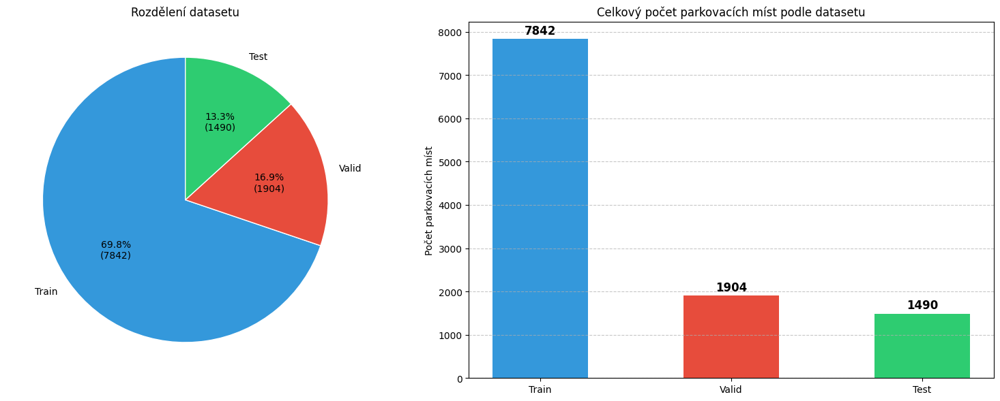

In [26]:
fig1, axes1 = plt.subplots(1, 2, figsize=(16, 6))

labels = list(roi_stats['split_percentages'].keys())
sizes = list(roi_stats['split_percentages'].values())

wedges, texts, autotexts = axes1[0].pie(
    sizes, labels=[s.capitalize() for s in labels],
    autopct='%1.1f%%', startangle=90,
    colors=['#3498db', '#e74c3c', '#2ecc71'],
    wedgeprops={'edgecolor': 'w', 'linewidth': 1})

# Add exact number of samples
for i, autotext in enumerate(autotexts):
    split = labels[i]
    count = roi_stats['total_rois'][split]
    autotext.set_text(f"{autotext.get_text()}\n({count})")

axes1[0].set_title('Rozdělení datasetu')

total_counts = [roi_stats['total_rois'][split] for split in labels]
x = np.arange(len(labels))

bars = axes1[1].bar(x, total_counts, width=0.5, color=['#3498db', '#e74c3c', '#2ecc71'])

# Add the exact count on top of each bar
for i, bar in enumerate(bars):
    height = bar.get_height()
    axes1[1].text(bar.get_x() + bar.get_width() / 2, height + 50,
                  f'{total_counts[i]}',
                  ha='center', va='bottom', fontsize=12, fontweight='bold')

axes1[1].set_ylabel('Počet parkovacích míst')
axes1[1].set_title('Celkový počet parkovacích míst podle datasetu')
axes1[1].set_xticks(x)
axes1[1].set_xticklabels([s.capitalize() for s in labels])
axes1[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

## Rovnováha jednotlivých tříd


In [27]:
for split, balance in class_balance.items():
    print(f"{split}:")
    print(f"\tOccupied: {balance['occupied']} ({balance['occupied_percentage']:.2f}%)")
    print(f"\tUnoccupied: {balance['unoccupied']} ({balance['unoccupied_percentage']:.2f}%)")

train:
	Occupied: 3940 (50.24%)
	Unoccupied: 3902 (49.76%)
valid:
	Occupied: 831 (43.64%)
	Unoccupied: 1073 (56.36%)
test:
	Occupied: 605 (40.60%)
	Unoccupied: 885 (59.40%)


Jednotlivé třídy jsou v datasetu slušně vyvážené. Pro trénování modelu máme skoro perfektní poměr 50:50 v **trénovací
množině**.

V **testovací množině** je to horší, ale stále je to slušné, poměr 43:57 pro prospěch neobsazených míst.

V **validační množině** je to strošilinku horší, ale stále je to slušné, poměr 40:60 pro prospěch obsazených míst.

Nemyslím si, že to bude mít vliv na trénink modelu, protože máme dostatek dat pro obě třídy. Proto jsem se rozhodl
neprovádět žádné úpravy a ponechat to tak, jak to je. Pokud by během tréninku modelu docházelo k určení pouze jedné
třídy, pak bychom museli provést úpravy.

Pro přehlednost jsou dostupné grafy níže.


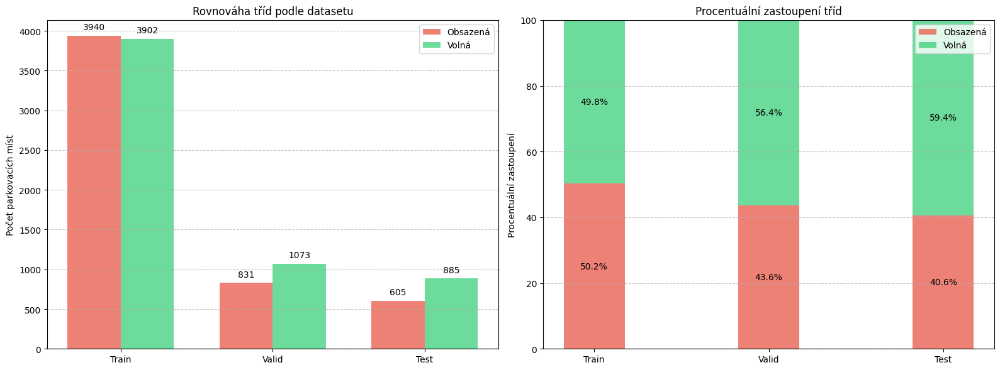

In [28]:
fig2, axes2 = plt.subplots(1, 2, figsize=(16, 6))

class_balance = roi_stats['class_balance']
labels = list(class_balance.keys())
occupied = [class_balance[split]['occupied'] for split in labels]
unoccupied = [class_balance[split]['unoccupied'] for split in labels]

x = np.arange(len(labels))
width_bar = 0.35

bars1 = axes2[0].bar(x - width_bar / 2, occupied, width_bar, label='Obsazená', color='#e74c3c', alpha=0.7)
bars2 = axes2[0].bar(x + width_bar / 2, unoccupied, width_bar, label='Volná', color='#2ecc71', alpha=0.7)

for i, bar in enumerate(bars1):
    height = bar.get_height()
    axes2[0].text(bar.get_x() + bar.get_width() / 2, height + 50,
                  f'{occupied[i]}',
                  ha='center', va='bottom', fontsize=10)

for i, bar in enumerate(bars2):
    height = bar.get_height()
    axes2[0].text(bar.get_x() + bar.get_width() / 2, height + 50,
                  f'{unoccupied[i]}',
                  ha='center', va='bottom', fontsize=10)

axes2[0].set_ylabel('Počet parkovacích míst')
axes2[0].set_title('Rovnováha tříd podle datasetu')
axes2[0].set_xticks(x)
axes2[0].set_xticklabels([s.capitalize() for s in labels])
axes2[0].legend()
axes2[0].grid(axis='y', linestyle='--', alpha=0.7)

occupied_pct = [class_balance[split]['occupied_percentage'] for split in labels]
unoccupied_pct = [class_balance[split]['unoccupied_percentage'] for split in labels]

bars3 = axes2[1].bar(x, occupied_pct, width_bar, label='Obsazená', color='#e74c3c', alpha=0.7)
bars4 = axes2[1].bar(x, unoccupied_pct, width_bar, bottom=occupied_pct, label='Volná', color='#2ecc71', alpha=0.7)

for i, bar in enumerate(bars3):
    height = bar.get_height() / 2
    axes2[1].text(bar.get_x() + bar.get_width() / 2, height,
                  f'{occupied_pct[i]:.1f}%',
                  ha='center', va='center', fontsize=10, color='black')

for i, bar in enumerate(bars4):
    y_pos = occupied_pct[i] + unoccupied_pct[i] / 2
    axes2[1].text(bar.get_x() + bar.get_width() / 2, y_pos,
                  f'{unoccupied_pct[i]:.1f}%',
                  ha='center', va='center', fontsize=10, color='black')

axes2[1].set_ylabel('Procentuální zastoupení')
axes2[1].set_title('Procentuální zastoupení tříd')
axes2[1].set_xticks(x)
axes2[1].set_xticklabels([s.capitalize() for s in labels])
axes2[1].set_ylim(0, 100)
axes2[1].legend()
axes2[1].grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

# Příprava pro trénování 🏋️‍♂️🔧

Pro trénování jsem se rozhodl použít knihovnu `PyTorch`, jelikož jsem s ní již pracoval a mám s ní dobré zkušenosti.


## Dataset 📂

Jak již bylo zmíněno výše, dataset je rozdělen do tří částí - trénovací, validační a testovací. Chvíli jsem přemýšlel
nad tím, zdali nesloučím trénovací a validační množinu do jedné, ale nakonec jsem se rozhodl je nechat oddělené. ✂️


Validační množina by měla sloužit k ladění hyperparametrů během trénování modelu a testovací množina by měla sloužit k
testování modelu po jeho natrénování. 

Všude snad, kde jsem se kdy podíval na dokumentaci PyTorch, vždy jsem viděl **early stopping** v trénovací smyčce, tak
jsem se rozhodl, že to udělám stejně a ponechám validační množinu oddělenou, abychom dodrželi záměr autorů. 📘


### DataLoader 🧱📦

`DataLoader` je třída, která slouží k načítání dat z datasetu a jejich "dávkování" do modelu.📥➡️🧠

Je to velmi užitečná třída, která nám umožňuje snadno pracovat s daty a zjednodušuje celý proces trénování modelu. Musíme ovšem převést data do
formátu, který `DataLoader` očekává. 🔄

Zkoušel jsem i **lazy loading**, kde místo obrázků načítám metadata, ale nakonec jsem se rozhodl pro **eager loading**,
protože byl *x-krát* rychlejší 🚀 a nemám tak velký dataset, abych se bál o paměť.

Třídy budou rozděleny následovně:
- **0 →** volné místo 🅿️
- **1 →** obsazené místo 🚗


In [29]:
class ParkingSpotDataset(Dataset):
    def __init__(self, annotations, images_dir, split, image_size=IMAGE_SIZE, transform=None):
        self.annotations = annotations
        self.images_dir = images_dir
        self.split = split
        self.image_size = image_size
        self.transform = transform

        self.all_images = []
        self.all_labels = []

        # Iterate through each image in the specified split and save corresponding information
        for idx, file_name in enumerate(annotations[split]['file_names']):
            rois = annotations[split]['rois_list'][idx]
            occupancy = annotations[split]['occupancy_list'][idx]

            image_path = os.path.join(images_dir, file_name)
            image = load_image(image_path)

            roi_images = cut_rois(image, rois)

            for roi_idx, roi_image in enumerate(roi_images):
                self.all_images.append(roi_image)
                self.all_labels.append(1 if occupancy[roi_idx] else 0)  # 1 for occupied, 0 for free

    def __len__(self):
        return len(self.all_images)

    def __getitem__(self, idx):
        image = self.all_images[idx]
        label = self.all_labels[idx]

        image = cv2.resize(image, (self.image_size, self.image_size))

        if self.transform:
            image = self.transform(image)
        else:
            image = torch.from_numpy(image.transpose((2, 0, 1))).float() / 255.0

        return image, label

### Augmentace dat 🧪🖼️

Můžeme si pomoc drobnou úpravou dat. Jednotlivé parkovací místa jsou různě orientovaná, zkosená a jakkoliv jinak
překroucená. 🔄 Můžeme tedy použít augmentaci dat, abychom ještě zvýšili jejich rozmanitost dat.

Trénovací množinu si můžeme dovolit upravit více, než testovací a validační množinu.


#### (Ne)převedení na gray-scale a normalizace dat 🎨🧮

Pokud bychom převedli fotografie na gray-scale, ztratili bychom spoustu informací. Fotky jsou opravdu různé, ať už se
jedná o počasí 🌦️, parkovací pruhy 🅿️, stromy 🌳, lampy 💡, různé překážky 🚧 a denní a noční kontrast 🌞🌙. Proto jsem
se rozhodl **nepoužívat** gray-scale.

Mohli jsme si všimnout na divnou hodnotu během normalizace dat. Pomáhá nám:

1. **Zrychlit učení** - Když jsou všechna čísla v podobném rozsahu, model se učí rychleji ⚡
2. **Zajistit stabilitu** - Předchází problémům při výpočtech 🧷
3. **Dává všem vstupům stejnou šanci ovlivnit výsledek** 🎯

Pro naše obrázky parkovacích míst používáme standardní hodnoty z ImageNet (`mean=[0.485, 0.456, 0.406]` a
`std=[0.229, 0.224, 0.225]`), protože:

- Umožňují využít již natrénované modely 🔁
- Jsou osvědčené a fungují dobře pro většinu obrázků ✅
- Převádí hodnoty pixelů na čísla blízká nule ➖➕


#### Trénovací augmentace

- **ToPILImage** - převod na PIL obrázek, je potřeba nějak načíst obrázek, aby se s ním dalo pracovat 🧾
- **RandomHorizontalFlip** - náhodné horizontální převrácení, použijeme pravděpodobnost `p=0.5`, což znamená, že
  polovina snímků bude převrácena zleva doprava naopak a polovina zůstane beze změny ↔️
- **RandomRotation** - náhodná rotace, zvolil jsem úhel rotace `degrees=15`, což znamená, že snímek bude otočen o
  náhodný úhel mezi -15 a 15 stupni. 🔄
- **ColorJitter** - náhodná změna barevnosti, zvolil jsem hodnoty `brightness=0.1`, `contrast=0.1`, `saturation=0.1`,
  což znamená že jasnost, kontrast a saturace budou náhodně změněny o hodnotu mezi -0.1 a 0.1. Našel jsem to v
  parametrech, nikdy jsem to nepoužil, uvidíme jak to dopadne a ovlivní model. 😀🧪
- **ToTensor** - převod na tensor 📊, je potřeba převést obrázek na tensor, aby se s ním dalo pracovat v PyTorch, je to
  v podstatě jen vícerozměrné pole 📦
- **Normalize** - normalizace, je potřeba normalizovat obrázek, aby měl průměr 0 a rozptyl 1, použijeme hodnoty
  `mean=[0.485, 0.456, 0.406]` a `std=[0.229, 0.224, 0.225]`, což jsou hodnoty pro ImageNet dataset

#### Validační a testovací augmentace ✅🔍

Pro validační a testovací množinu použijeme pouze základní transformace bez augmentace:

- **ToPILImage** - převod na PIL obrázek
- **ToTensor** - převod na tensor
- **Normalize** - normalizace s hodnotami pro ImageNet dataset


In [30]:
def get_transforms(split):
    if split == 'train':
        return transforms.Compose([
            transforms.ToPILImage(),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomRotation(degrees=15),
            transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
    else:
        return transforms.Compose([
            transforms.ToPILImage(),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])

### Načtení dat

Tato část kódu definuje vlastní dataset, který načítá obrázky a anotace spolu s transformacemi.

#### Trénovací dataset

(Lokálně to spustit podruhé nešlo, tak bacha na to.)


In [31]:
train_dataset = ParkingSpotDataset(
    json_annotations,
    images_dir,
    'train',
    image_size=IMAGE_SIZE,
    transform=get_transforms('train')
)

#### Validační dataset


In [32]:
valid_dataset = ParkingSpotDataset(
    json_annotations,
    images_dir,
    'valid',
    image_size=IMAGE_SIZE,
    transform=get_transforms('valid')
)

#### Testovací dataset


In [33]:
test_dataset = ParkingSpotDataset(
    json_annotations,
    images_dir,
    'test',
    image_size=IMAGE_SIZE,
    transform=get_transforms('test')
)

In [34]:
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}")
print(f"Number of test samples: {len(test_dataset)}")

Number of training samples: 7842
Number of validation samples: 1904
Number of test samples: 1490


Dostáváme stejný počet jednotlivých ROI oblastí jako při analýze anotací. 🎯📐 Paráda! 💪


### Instanciace DataLoaderů

Nastavení DataLoader pro načítání dávek dat do paměti pro trénink.


In [35]:
BATCH_SIZE = 32

Jelikož máme velké rozlišení obrázků, batch_size **32** je pro nás ideální. 🧠🖼️
Větší číslo by mohlo způsobit problémy s pamětí 💥💾, menší zase zbytečně prodloužit čas trénování 🐢⏱️.

#### Trénovací DataLoader


In [36]:
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True
)

#### Validační DataLoader


In [37]:
valid_loader = DataLoader(
    valid_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

#### Testovací DataLoader


In [38]:
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

### Ukázka augmentace

Trénovací sada by měla být nakloněna a otočená. Validační a testovací sada by měly být bez jakýchkoliv úprav. Pojďme se
na to podívat.


In [39]:
def show_balanced_batch(dataloader, num_samples=8):
    for images, labels in dataloader:  # get one batch until we find one with both classes distributed evenly
        occupied_indices = [i for i, label in enumerate(labels) if label == 1]
        free_indices = [i for i, label in enumerate(labels) if label == 0]

        if len(occupied_indices) >= num_samples // 2 and len(free_indices) >= num_samples // 2:
            break

    samples_per_class = num_samples // 2

    occupied_to_show = random.sample(occupied_indices, min(samples_per_class, len(occupied_indices)))
    free_to_show = random.sample(free_indices, min(samples_per_class, len(free_indices)))
    indices_to_show = occupied_to_show + free_to_show
    random.shuffle(indices_to_show)

    fig, axes = plt.subplots(2, 4, figsize=(12, 6))
    axes = axes.flatten()

    for i, idx in enumerate(indices_to_show[:num_samples]):
        img = images[idx].permute(1, 2, 0).numpy()  # tensor to numpy

        # Denormalize the image
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        img = std * img + mean
        img = np.clip(img, 0, 1)

        axes[i].imshow(img)
        axes[i].set_title(f"{'Occupied' if labels[idx] == 1 else 'Free'}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

#### Trénovací DataLoader


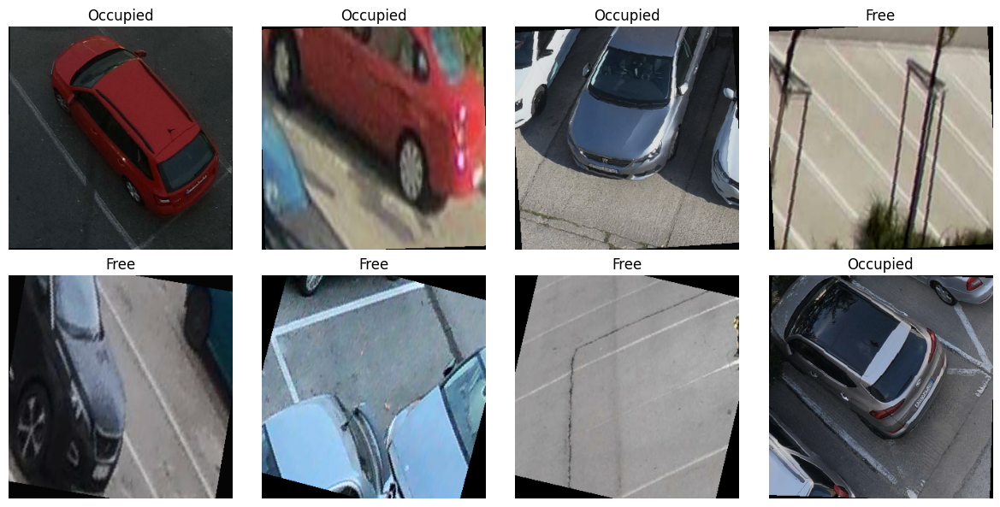

In [40]:
show_balanced_batch(train_loader)

Vidíme, že výřezy jsou různě otočené a nakloněné, možná někdy i více nasaturované. 🔄🎨

To je přesně to, co jsme chtěli! 

#### Validační DataLoader


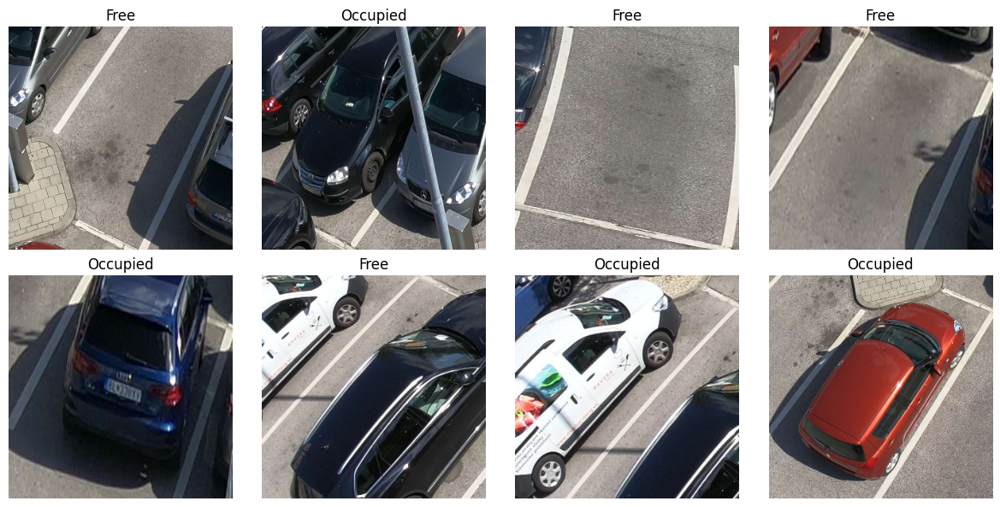

In [41]:
show_balanced_batch(valid_loader)

#### Testovací DataLoader


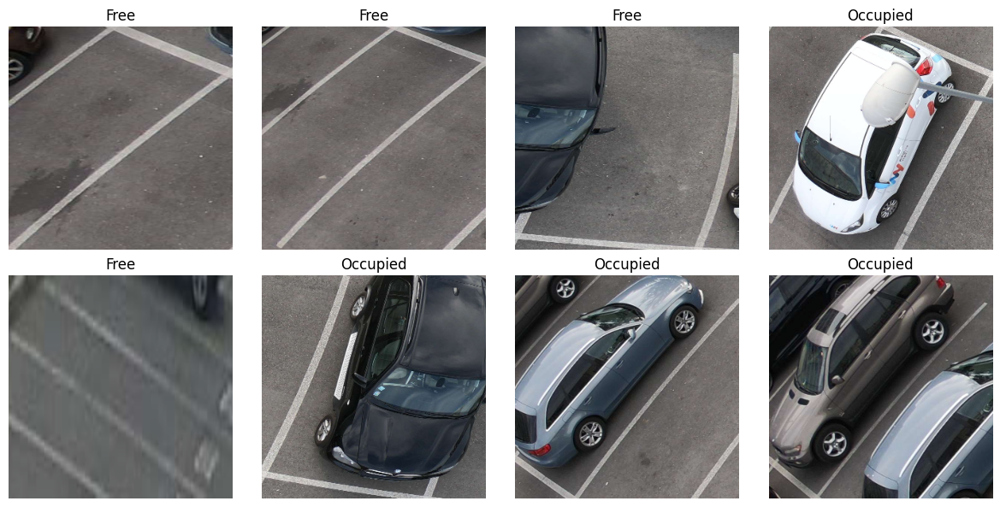

In [42]:
show_balanced_batch(test_loader)

Validační a testovací DataLoader by měly být bez jakýchkoliv úprav.


## Zvolení metriky 📊


Pro dataset jsem jako hlavní metriku zvolil **F1 skóre**, a to z několika klíčových důvodů:

- **Vyváženost mezi přesností a úplností** - F1 skóre je harmonický průměr precision a recall, což je skvělé pro náš
  případ, kde potřebujeme spolehlivě detekovat jak obsazená, tak volná parkovací místa 🚗🅿️ pro komfort řidičů okamžitě
  najít volné místo. 🔍
- **Různá cena chyb** - v reálném nasazení má falešně pozitivní detekce (označení volného místa jako obsazeného) jiný
  dopad než falešně negativní (označení obsazeného místa jako volného). ⚠️🚫✅ F1 skóre nám pomáhá najít optimální
  kompromis. ⚖️

- **Mírná nevyváženost tříd** - dataset není perfektně vyvážený (v testovací sadě máme poměr 43:57), proto je F1 skóre
  vhodnější než prostá přesnost (accuracy). 📉

- **Potřeba robustního hodnocení** - v prostředí parkovišť, kde se projevují různé světelné podmínky 🌤️🌙, překrytí 🚧 a
  další komplikace, je důležité mít metriku, která nezkresluje výkon modelu.


# Model


In [43]:
NUM_CLASSES = 2

## Popis architektury modelu `MyAwesomeModel` (PyTorch)

### ⚙️ Konstruktor: `__init__`

#### Parametry

- `num_classes` _(int)_: Počet výstupních tříd. Určuje velikost výstupního vektoru na konci sítě. 🎯
- `num_blocks` _(int)_: Počet konvolučních bloků, které tvoří základ sítě. Oříznuto na rozsah 2 až 7, aby se síť nestala
  příliš mělkou nebo přetíženou. ⚖️
- `start_channels` _(int)_: Počet neuronů (název jsem na začátku zvolil nešťastně, za to se omlouvám) v první konvoluční
  vrstvě. Doporučená hodnota je ≤32, protože vyšší hodnoty způsobují neefektivní trénování a práci s pamětí. 🧠💾

### 🧱 Architektura

#### 1. **Konvoluční část (Feature Extractor)** 🧠📦

Tato část modelu se skládá z několika opakujících se konvolučních bloků, uložených v `self.blocks`, což je instance
`torch.nn.ModuleList`. Každý blok zahrnuje:

- `Conv2d`: Konvoluční vrstva s jádrem 3×3 a padding 1. 🎯
- `BatchNorm2d`: Normalizace aktivací napříč kanály, zrychluje a stabilizuje učení. 📊
- `ReLU`: Aktivační funkce zavádějící nelinearitu. ⚡
- `MaxPool2d(2)`: Max pooling s jádrem 2×2 a krokem 2, který snižuje rozměry na polovinu. ↘️

Od **čtvrtého bloku dále (index ≥ 3)** je navíc přidán:

- `Dropout2d(0.25)`: Prvková dropout vrstva pro 2D data (např. obrázky), která náhodně vynuluje celé kanály během
  tréninku. ❌🎲

#### 🔁 Výpočet kanálů pro každý blok

Počet výstupních kanálů se řídí následující logikou:

- První dva bloky **zdvojnásobují** počet kanálů:  
  `start_channels → start_channels * 2 → start_channels * 4`
- Další bloky zvyšují počet kanálů, ale nikdy nepřekročí **512**.
- Poslední blok **nezvyšuje** počet kanálů dále. 🚫📈

#### 2. **Sběr globálních rysů** 🌍📉

Po průchodu konvolučními bloky se převádí prostorové výstupy na vektor vhodný pro klasifikaci:

- `AdaptiveAvgPool2d(1)`: Pro každý kanál spočítá průměr všech hodnot ➗
- `Dropout(0.5)`: Klasický dropout pro regularizaci před plně propojenou vrstvou. Zabraňuje přeučení. 🎛️

#### 3. **Plně propojená část (Classifier Head)** 🎯

Tato část tvoří tzv. "klasifikátor", skládá se z několika vrstev:

1. `Linear(channels[-1], 512)`: První plně propojená vrstva, která zmenší vstupní dimenzi na 512 neuronů. 🧮
2. `ReLU()`: Nelinearita mezi dense vrstvami. ⚡
3. `Dropout(0.5)`: Opětovný dropout pro další regularizaci. 💧
4. `Linear(512, num_classes)`: Závěrečná lineární vrstva, která produkuje výstupní vektor o délce `num_classes`. 📤


In [ ]:
class MyAwesomeModel(torch.nn.Module):
    def __init__(self, num_classes=NUM_CLASSES, num_blocks=5, start_channels=16):
        super(MyAwesomeModel, self).__init__()

        # NOTE! Locally I found that more than 32, (e.g. 64) channels in the first layer get stuck in training
        # and it doesn't even start learning. Use on your own risk.

        num_blocks = max(2, min(num_blocks, 7))  # limit between 2 and 7 blocks

        self.blocks = torch.nn.ModuleList()  # to hold the convolutional blocks
        in_rgb_channels = 3

        # Calculate channel progression based on start_channels
        channels = []
        current_channels = start_channels
        for i in range(num_blocks):
            channels.append(current_channels)
            if i < 2:  # Double channels for first few layers
                current_channels *= 2
            elif i < num_blocks - 1:  # Don't increase channels in last layer
                current_channels = min(current_channels * 2, 512)  # cap at 512 channels

        # Create convolutional blocks dynamically
        for i, out_channels in enumerate(channels):
            block = torch.nn.Sequential(
                torch.nn.Conv2d(in_rgb_channels, out_channels, kernel_size=3, padding=1),
                torch.nn.BatchNorm2d(out_channels),
                torch.nn.ReLU(),
                torch.nn.MaxPool2d(2)
            )

            # Add dropout to later layers, after the 3rd block
            if i >= 3:
                block.add_module(f"dropout{i}", torch.nn.Dropout2d(0.25))

            self.blocks.append(block)
            in_rgb_channels = out_channels

        # Global pooling and classifier
        self.global_pool = torch.nn.AdaptiveAvgPool2d(1)
        self.dropout = torch.nn.Dropout(0.5)

        # FC layers
        self.fc1 = torch.nn.Linear(channels[-1], 512)
        self.fc_act = torch.nn.ReLU()
        self.fc_dropout = torch.nn.Dropout(0.5)
        self.fc2 = torch.nn.Linear(512, num_classes)

    def forward(self, x):
        for block in self.blocks:
            x = block(x)

        x = self.global_pool(x)
        x = torch.flatten(x, 1)
        x = self.dropout(x)
        x = self.fc1(x)
        x = self.fc_act(x)
        x = self.fc_dropout(x)
        x = self.fc2(x)
        return x

In [45]:
awesome_model = MyAwesomeModel().to(device)
summary(awesome_model, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 16, 160, 160]        --
│    │    └─Conv2d: 3-1                  [32, 16, 320, 320]        448
│    │    └─BatchNorm2d: 3-2             [32, 16, 320, 320]        32
│    │    └─ReLU: 3-3                    [32, 16, 320, 320]        --
│    │    └─MaxPool2d: 3-4               [32, 16, 160, 160]        --
│    └─Sequential: 2-2                   [32, 32, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 32, 160, 160]        4,640
│    │    └─BatchNorm2d: 3-6             [32, 32, 160, 160]        64
│    │    └─ReLU: 3-7                    [32, 32, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 32, 80, 80]          --
│    └─Sequential: 2-3                   [32, 64, 40, 40]          --
│    │    └

Dostáváme se na 0,5M parametrů v defaultním, což už je velmi slušné. Zmenšit a zvětšit model je velmi snadné pomocí
přidání dalších bloků a změny počtu kanálů.


# Trénování modelu


## Hyperparametry ⚙️📊

`Epochy` a `learning rate` jsou klasika, ale early stopping patience už tak běžné není. 

Kvůli němu jsme ponechali validační množinu oddělenou – sledujeme, zda se model po určitý počet epoch **zlepšuje**.

- Pokud je příliš malé, model nedostane šanci něco se naučit. 📉
- Pokud je příliš velké, může se přeučit a trénink zbytečně trvá. 🐌⏱️

Zvolil jsem hodnotu pětinu všech epoch jako rozumný kompromis. ⚖️

Model má čas se ukázat, ale nevaříme procesor do nekonečna. 💻🌡️


In [ ]:
EPOCHS = 25
EARLY_STOPPING_PATIENCE = EPOCHS // 5  # 20% epoch
LEARNING_RATE = 0.001

Dále tu máme příklad nastavení trénování modelu pomocí PyTorch.

- **Ztrátová funkce:** `CrossEntropyLoss` – vhodná pro klasifikační úlohy.
- **Optimalizátor:** `Adam` s učením `lr=LEARNING_RATE` – efektivní pro většinu modelů.
- **Scheduler:** `ReduceLROnPlateau` – sníží learning rate na polovinu (`factor=0.5`), pokud se validační ztráta
  nezlepší po 2 epochách (`patience=2`), s výpisem změn (`verbose=True`).


In [47]:
criterion = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(awesome_model.parameters(), lr=LEARNING_RATE)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=2, verbose=True)

/home/vojte/.virtualenvs/hluboke-uceni/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


## Jednotlivé funkce


### Trénink pro jednu epochu


In [48]:
def train_one_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    start_time = time.time()

    progress_bar = tqdm.tqdm(enumerate(dataloader), total=len(dataloader),
                             desc="Training", leave=False,
                             bar_format="{l_bar}{bar:30}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}{postfix}]",
                             colour="#1E88E5")

    for i, (images, labels) in progress_bar:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Accumulate loss
        running_loss += loss.item() * images.size(0)

        # Calculate predictions
        _, preds = torch.max(outputs, 1)

        # Store predictions and labels
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

        # Calculate batch accuracy for progress bar
        batch_acc = (preds == labels).float().mean().item()

        progress_bar.set_postfix({
            'loss': f"{loss.item():.4f}",
            'acc': f"{batch_acc:.4f}"
        }, refresh=True)

    epoch_time = time.time() - start_time

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    epoch_precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    epoch_recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    epoch_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return {
        'loss': epoch_loss,
        'acc': epoch_acc,
        'precision': epoch_precision,
        'recall': epoch_recall,
        'f1': epoch_f1,
        'preds': all_preds,
        'labels': all_labels,
        'time': epoch_time
    }

### Vyhodnocení pro jednu epochu


In [ ]:
def validate(model, dataloader, criterion, device):
    model.eval()
    running_loss = 0.0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        progress_bar = tqdm.tqdm(enumerate(dataloader), total=len(dataloader),
                                 desc="Validation", leave=False,
                                 bar_format="{l_bar}{bar:30}| {n_fmt}/{total_fmt} [{elapsed}<{remaining}, {rate_fmt}{postfix}]",
                                 colour="#FFC107")

        for i, (images, labels) in progress_bar:
            images = images.to(device)
            labels = labels.to(device)

            # Forward
            outputs = model(images)
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * images.size(0)

            # Calculate accuracy
            _, preds = torch.max(outputs, 1)

            # Calculate batch accuracy for progress bar
            batch_acc = (preds == labels).float().mean().item()

            # Store predictions and labels
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

            progress_bar.set_postfix({
                'loss': f"{loss.item():.4f}",
                'acc': f"{batch_acc:.4f}"
            }, refresh=True)

    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_acc = accuracy_score(all_labels, all_preds)
    epoch_precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    epoch_recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    epoch_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    return {
        'loss': epoch_loss,
        'acc': epoch_acc,
        'precision': epoch_precision,
        'recall': epoch_recall,
        'f1': epoch_f1,
        'preds': all_preds,
        'labels': all_labels
    }

### Vše dohromady

Nastavil jsem `early stopping` tak, že se restartuje proměnná, pokud se zlepšila validační ztráta. Pokud se nezlepšila,
tak se zvyšuje `patience` a pokud je větší než `early_stopping_patience`, tak se trénink ukončí. Pokud se zlepší, tak se
`patience` resetuje na 0.


In [50]:
def train_model(model, train_loader, valid_loader, criterion, optimizer, scheduler, num_epochs=10, patience=5):
    best_val_loss = float('inf')
    best_model_weights = None
    train_losses, val_losses = [], []
    train_accs, val_accs = [], []
    train_precisions, val_precisions = [], []
    train_recalls, val_recalls = [], []
    train_f1s, val_f1s = [], []
    epoch_times = []

    epochs_no_improve = 0

    total_start_time = time.time()

    for epoch in range(num_epochs):
        print(f"\nEpoch {epoch + 1}/{num_epochs}")
        print('-' * 10)

        train_metrics = train_one_epoch(model, train_loader, criterion, optimizer, device)
        epoch_times.append(train_metrics['time'])

        val_metrics = validate(model, valid_loader, criterion, device)

        scheduler.step(val_metrics['loss'])

        train_losses.append(train_metrics['loss'])
        val_losses.append(val_metrics['loss'])
        train_accs.append(train_metrics['acc'])
        val_accs.append(val_metrics['acc'])
        train_precisions.append(train_metrics['precision'])
        val_precisions.append(val_metrics['precision'])
        train_recalls.append(train_metrics['recall'])
        val_recalls.append(val_metrics['recall'])
        train_f1s.append(train_metrics['f1'])
        val_f1s.append(val_metrics['f1'])

        # Format time as minutes:seconds
        epoch_time_formatted = str(timedelta(seconds=int(train_metrics['time'])))

        print(f"Training: Loss: {train_metrics['loss']:.4f}, Acc: {train_metrics['acc']:.4f}, "
              f"Precision: {train_metrics['precision']:.4f}, Recall: {train_metrics['recall']:.4f}, "
              f"F1: {train_metrics['f1']:.4f}")
        print(f"Validation: Loss: {val_metrics['loss']:.4f}, Acc: {val_metrics['acc']:.4f}, "
              f"Precision: {val_metrics['precision']:.4f}, Recall: {val_metrics['recall']:.4f}, "
              f"F1: {val_metrics['f1']:.4f}")
        print(f"Epoch time: {epoch_time_formatted}")

        # Check for early stopping
        if val_metrics['loss'] < best_val_loss:
            best_val_loss = val_metrics['loss']
            best_model_weights = model.state_dict().copy()
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1

        if epochs_no_improve >= patience:
            print(f'Early stopping triggered after {epoch + 1} epochs')
            break

    total_training_time = time.time() - total_start_time
    total_time_formatted = str(timedelta(seconds=int(total_training_time)))
    print(f"\nTotal training time: {total_time_formatted}")

    if best_model_weights:
        model.load_state_dict(best_model_weights)

    history = {
        'train_loss': train_losses, 'val_loss': val_losses,
        'train_acc': train_accs, 'val_acc': val_accs,
        'train_precision': train_precisions, 'val_precision': val_precisions,
        'train_recall': train_recalls, 'val_recall': val_recalls,
        'train_f1': train_f1s, 'val_f1': val_f1s,
        'epoch_times': epoch_times,
        'total_time': total_training_time
    }

    return model, history

## Trénování vlastních modelů


### Základní počet bloků


#### Základní model s defaultními parametry


In [51]:
awesome_model, awesome_history = train_model(
    model=awesome_model,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)

torch.save(awesome_model.state_dict(), 'parking_detection_model.pth')


Epoch 1/25
----------


Training: Loss: 0.4887, Acc: 0.7728, Precision: 0.7747, Recall: 0.7728, F1: 0.7723
Validation: Loss: 0.3317, Acc: 0.8650, Precision: 0.8740, Recall: 0.8650, F1: 0.8656
Epoch time: 0:01:11

Epoch 2/25
----------


Training: Loss: 0.4351, Acc: 0.8090, Precision: 0.8117, Recall: 0.8090, F1: 0.8085
Validation: Loss: 0.3348, Acc: 0.8514, Precision: 0.8512, Recall: 0.8514, F1: 0.8513
Epoch time: 0:01:10

Epoch 3/25
----------


Training: Loss: 0.4082, Acc: 0.8245, Precision: 0.8280, Recall: 0.8245, F1: 0.8240
Validation: Loss: 0.3099, Acc: 0.8729, Precision: 0.8750, Recall: 0.8729, F1: 0.8733
Epoch time: 0:01:11

Epoch 4/25
----------


Training: Loss: 0.3938, Acc: 0.8386, Precision: 0.8407, Recall: 0.8386, F1: 0.8383
Validation: Loss: 0.2660, Acc: 0.8971, Precision: 0.9053, Recall: 0.8971, F1: 0.8975
Epoch time: 0:01:34

Epoch 5/25
----------


Training: Loss: 0.3782, Acc: 0.8425, Precision: 0.8454, Recall: 0.8425, F1: 0.8421
Validation: Loss: 0.2548, Acc: 0.9044, Precision: 0.9078, Recall: 0.9044, F1: 0.9047
Epoch time: 0:01:44

Epoch 6/25
----------


Training: Loss: 0.3634, Acc: 0.8507, Precision: 0.8541, Recall: 0.8507, F1: 0.8503
Validation: Loss: 0.2358, Acc: 0.9107, Precision: 0.9141, Recall: 0.9107, F1: 0.9110
Epoch time: 0:02:01

Epoch 7/25
----------


Training: Loss: 0.3441, Acc: 0.8590, Precision: 0.8606, Recall: 0.8590, F1: 0.8588
Validation: Loss: 0.2324, Acc: 0.9112, Precision: 0.9175, Recall: 0.9112, F1: 0.9116
Epoch time: 0:01:25

Epoch 8/25
----------


Training: Loss: 0.3396, Acc: 0.8652, Precision: 0.8671, Recall: 0.8652, F1: 0.8650
Validation: Loss: 0.2186, Acc: 0.9133, Precision: 0.9154, Recall: 0.9133, F1: 0.9136
Epoch time: 0:01:08

Epoch 9/25
----------


Training: Loss: 0.3351, Acc: 0.8625, Precision: 0.8650, Recall: 0.8625, F1: 0.8623
Validation: Loss: 0.2064, Acc: 0.9202, Precision: 0.9265, Recall: 0.9202, F1: 0.9205
Epoch time: 0:01:29

Epoch 10/25
----------


Training: Loss: 0.3351, Acc: 0.8632, Precision: 0.8645, Recall: 0.8632, F1: 0.8630
Validation: Loss: 0.3023, Acc: 0.8887, Precision: 0.9093, Recall: 0.8887, F1: 0.8889
Epoch time: 0:01:08

Epoch 11/25
----------


Training: Loss: 0.3190, Acc: 0.8740, Precision: 0.8749, Recall: 0.8740, F1: 0.8739
Validation: Loss: 0.2792, Acc: 0.8929, Precision: 0.9110, Recall: 0.8929, F1: 0.8932
Epoch time: 0:01:11

Epoch 12/25
----------


Training: Loss: 0.3229, Acc: 0.8680, Precision: 0.8689, Recall: 0.8680, F1: 0.8679
Validation: Loss: 0.2281, Acc: 0.9107, Precision: 0.9160, Recall: 0.9107, F1: 0.9111
Epoch time: 0:01:42

Epoch 13/25
----------


Training: Loss: 0.3018, Acc: 0.8838, Precision: 0.8848, Recall: 0.8838, F1: 0.8837
Validation: Loss: 0.2190, Acc: 0.9196, Precision: 0.9298, Recall: 0.9196, F1: 0.9200
Epoch time: 0:01:14

Epoch 14/25
----------


Training: Loss: 0.3034, Acc: 0.8786, Precision: 0.8796, Recall: 0.8786, F1: 0.8785
Validation: Loss: 0.2035, Acc: 0.9270, Precision: 0.9337, Recall: 0.9270, F1: 0.9273
Epoch time: 0:01:08

Epoch 15/25
----------


Training: Loss: 0.2878, Acc: 0.8824, Precision: 0.8834, Recall: 0.8824, F1: 0.8823
Validation: Loss: 0.2513, Acc: 0.9118, Precision: 0.9229, Recall: 0.9118, F1: 0.9121
Epoch time: 0:01:11

Epoch 16/25
----------


Training: Loss: 0.2876, Acc: 0.8852, Precision: 0.8858, Recall: 0.8852, F1: 0.8852
Validation: Loss: 0.2101, Acc: 0.9181, Precision: 0.9249, Recall: 0.9181, F1: 0.9184
Epoch time: 0:01:03

Epoch 17/25
----------


Training: Loss: 0.2814, Acc: 0.8854, Precision: 0.8865, Recall: 0.8854, F1: 0.8853
Validation: Loss: 0.1983, Acc: 0.9275, Precision: 0.9341, Recall: 0.9275, F1: 0.9278
Epoch time: 0:01:07

Epoch 18/25
----------


Training: Loss: 0.2821, Acc: 0.8875, Precision: 0.8883, Recall: 0.8875, F1: 0.8875
Validation: Loss: 0.2095, Acc: 0.9228, Precision: 0.9324, Recall: 0.9228, F1: 0.9231
Epoch time: 0:01:24

Epoch 19/25
----------


Training: Loss: 0.2764, Acc: 0.8907, Precision: 0.8916, Recall: 0.8907, F1: 0.8906
Validation: Loss: 0.2115, Acc: 0.9228, Precision: 0.9324, Recall: 0.9228, F1: 0.9231
Epoch time: 0:01:05

Epoch 20/25
----------


Training: Loss: 0.2750, Acc: 0.8929, Precision: 0.8938, Recall: 0.8929, F1: 0.8928
Validation: Loss: 0.2619, Acc: 0.9091, Precision: 0.9231, Recall: 0.9091, F1: 0.9095
Epoch time: 0:01:14

Epoch 21/25
----------


Training: Loss: 0.2635, Acc: 0.8956, Precision: 0.8964, Recall: 0.8956, F1: 0.8955
Validation: Loss: 0.2223, Acc: 0.9165, Precision: 0.9269, Recall: 0.9165, F1: 0.9168
Epoch time: 0:01:04

Epoch 22/25
----------


Training: Loss: 0.2603, Acc: 0.9000, Precision: 0.9004, Recall: 0.9000, F1: 0.9000
Validation: Loss: 0.1975, Acc: 0.9244, Precision: 0.9321, Recall: 0.9244, F1: 0.9247
Epoch time: 0:01:12

Epoch 23/25
----------


Training: Loss: 0.2600, Acc: 0.8917, Precision: 0.8923, Recall: 0.8917, F1: 0.8917
Validation: Loss: 0.1902, Acc: 0.9280, Precision: 0.9340, Recall: 0.9280, F1: 0.9283
Epoch time: 0:01:12

Epoch 24/25
----------


Training: Loss: 0.2630, Acc: 0.8940, Precision: 0.8945, Recall: 0.8940, F1: 0.8940
Validation: Loss: 0.2176, Acc: 0.9154, Precision: 0.9262, Recall: 0.9154, F1: 0.9158
Epoch time: 0:01:04

Epoch 25/25
----------


                                                                                                        s=0.5191, acc=0.6875]]

Training: Loss: 0.2567, Acc: 0.8967, Precision: 0.8971, Recall: 0.8967, F1: 0.8967
Validation: Loss: 0.2077, Acc: 0.9186, Precision: 0.9293, Recall: 0.9186, F1: 0.9189
Epoch time: 0:01:05

Total training time: 0:35:24


#### Základní model s více neurony

Jelikož náš základní model má základní hodnoty parametru `num_blocks=5`, rovnou zkusíme zvýšit počet neuronů.


In [52]:
model_5_blocks_32_channels = MyAwesomeModel(num_blocks=5, start_channels=32).to(device)
summary(model_5_blocks_32_channels, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 32, 160, 160]        --
│    │    └─Conv2d: 3-1                  [32, 32, 320, 320]        896
│    │    └─BatchNorm2d: 3-2             [32, 32, 320, 320]        64
│    │    └─ReLU: 3-3                    [32, 32, 320, 320]        --
│    │    └─MaxPool2d: 3-4               [32, 32, 160, 160]        --
│    └─Sequential: 2-2                   [32, 64, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 64, 160, 160]        18,496
│    │    └─BatchNorm2d: 3-6             [32, 64, 160, 160]        128
│    │    └─ReLU: 3-7                    [32, 64, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 64, 80, 80]          --
│    └─Sequential: 2-3                   [32, 128, 40, 40]         --
│    │   

In [53]:
model_5_blocks_32_channels, history_5_blocks_32_channels = train_model(
    model=model_5_blocks_32_channels,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_5_blocks_32_channels.state_dict(), 'parking_detection_model_5_blocks_32_channels.pth')


Epoch 1/25
----------


Training: Loss: 0.7319, Acc: 0.4940, Precision: 0.4934, Recall: 0.4940, F1: 0.4902
Validation: Loss: 0.7064, Acc: 0.3561, Precision: 0.2975, Recall: 0.3561, F1: 0.2740
Epoch time: 0:01:24

Epoch 2/25
----------


Training: Loss: 0.7324, Acc: 0.4904, Precision: 0.4898, Recall: 0.4904, F1: 0.4874
Validation: Loss: 0.7056, Acc: 0.3613, Precision: 0.3629, Recall: 0.3613, F1: 0.3320
Epoch time: 0:01:26

Epoch 3/25
----------


Training: Loss: 0.7279, Acc: 0.4950, Precision: 0.4945, Recall: 0.4950, F1: 0.4917
Validation: Loss: 0.7072, Acc: 0.3304, Precision: 0.3109, Recall: 0.3304, F1: 0.2883
Epoch time: 0:01:26

Epoch 4/25
----------


Training: Loss: 0.7216, Acc: 0.5065, Precision: 0.5063, Recall: 0.5065, F1: 0.5027
Validation: Loss: 0.7090, Acc: 0.3277, Precision: 0.2887, Recall: 0.3277, F1: 0.2708
Epoch time: 0:01:25

Epoch 5/25
----------


Training: Loss: 0.7294, Acc: 0.5003, Precision: 0.4999, Recall: 0.5003, F1: 0.4967
Validation: Loss: 0.7059, Acc: 0.3340, Precision: 0.3253, Recall: 0.3340, F1: 0.3014
Epoch time: 0:01:15

Epoch 6/25
----------


Training: Loss: 0.7291, Acc: 0.4903, Precision: 0.4897, Recall: 0.4903, F1: 0.4871
Validation: Loss: 0.7059, Acc: 0.3325, Precision: 0.3066, Recall: 0.3325, F1: 0.2840
Epoch time: 0:01:20

Epoch 7/25
----------


                                                                                                        s=0.6918, acc=0.5625]]

Training: Loss: 0.7329, Acc: 0.4931, Precision: 0.4925, Recall: 0.4931, F1: 0.4893
Validation: Loss: 0.7062, Acc: 0.3356, Precision: 0.3306, Recall: 0.3356, F1: 0.3068
Epoch time: 0:01:17
Early stopping triggered after 7 epochs

Total training time: 0:10:24


#### Základní model s menším počtem neuronů


In [54]:
model_5_blocks_8_channels = MyAwesomeModel(num_blocks=5, start_channels=8).to(device)
summary(model_5_blocks_8_channels, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 8, 160, 160]         --
│    │    └─Conv2d: 3-1                  [32, 8, 320, 320]         224
│    │    └─BatchNorm2d: 3-2             [32, 8, 320, 320]         16
│    │    └─ReLU: 3-3                    [32, 8, 320, 320]         --
│    │    └─MaxPool2d: 3-4               [32, 8, 160, 160]         --
│    └─Sequential: 2-2                   [32, 16, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 16, 160, 160]        1,168
│    │    └─BatchNorm2d: 3-6             [32, 16, 160, 160]        32
│    │    └─ReLU: 3-7                    [32, 16, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 16, 80, 80]          --
│    └─Sequential: 2-3                   [32, 32, 40, 40]          --
│    │    └

In [55]:
model_5_blocks_8_channels, history_5_blocks_8_channels = train_model(
    model=model_5_blocks_8_channels,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_5_blocks_8_channels.state_dict(), 'parking_detection_model_5_blocks_8_channels.pth')


Epoch 1/25
----------


Training: Loss: 0.8730, Acc: 0.5004, Precision: 0.5137, Recall: 0.5004, F1: 0.3735
Validation: Loss: 0.7249, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:01:00

Epoch 2/25
----------


Training: Loss: 0.8774, Acc: 0.4980, Precision: 0.5008, Recall: 0.4980, F1: 0.3704
Validation: Loss: 0.7220, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:01:05

Epoch 3/25
----------


Training: Loss: 0.8671, Acc: 0.4985, Precision: 0.5036, Recall: 0.4985, F1: 0.3703
Validation: Loss: 0.7185, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:01:29

Epoch 4/25
----------


Training: Loss: 0.8730, Acc: 0.5061, Precision: 0.5408, Recall: 0.5061, F1: 0.3838
Validation: Loss: 0.7220, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:53

Epoch 5/25
----------


Training: Loss: 0.8762, Acc: 0.5017, Precision: 0.5218, Recall: 0.5017, F1: 0.3731
Validation: Loss: 0.7215, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:53

Epoch 6/25
----------


Training: Loss: 0.8644, Acc: 0.5040, Precision: 0.5315, Recall: 0.5040, F1: 0.3794
Validation: Loss: 0.7202, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:53

Epoch 7/25
----------


Training: Loss: 0.8733, Acc: 0.5032, Precision: 0.5302, Recall: 0.5032, F1: 0.3752
Validation: Loss: 0.7230, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:53

Epoch 8/25
----------


                                                                                                        s=0.7139, acc=0.5625]]

Training: Loss: 0.8768, Acc: 0.4992, Precision: 0.5074, Recall: 0.4992, F1: 0.3729
Validation: Loss: 0.7236, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:53
Early stopping triggered after 8 epochs

Total training time: 0:08:42


### Základní model s méně bloky


#### Základní model s méně bloky


In [56]:
model_3_blocks = MyAwesomeModel(num_blocks=3).to(device)
summary(model_3_blocks, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 16, 160, 160]        --
│    │    └─Conv2d: 3-1                  [32, 16, 320, 320]        448
│    │    └─BatchNorm2d: 3-2             [32, 16, 320, 320]        32
│    │    └─ReLU: 3-3                    [32, 16, 320, 320]        --
│    │    └─MaxPool2d: 3-4               [32, 16, 160, 160]        --
│    └─Sequential: 2-2                   [32, 32, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 32, 160, 160]        4,640
│    │    └─BatchNorm2d: 3-6             [32, 32, 160, 160]        64
│    │    └─ReLU: 3-7                    [32, 32, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 32, 80, 80]          --
│    └─Sequential: 2-3                   [32, 64, 40, 40]          --
│    │    └

In [57]:
model_3_blocks, history_3_blocks = train_model(
    model=model_3_blocks,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_3_blocks.state_dict(), 'parking_detection_model_3_blocks.pth')


Epoch 1/25
----------


Training: Loss: 0.7336, Acc: 0.4908, Precision: 0.4889, Recall: 0.4908, F1: 0.4509
Validation: Loss: 0.6982, Acc: 0.5641, Precision: 0.6088, Recall: 0.5641, F1: 0.4084
Epoch time: 0:00:52

Epoch 2/25
----------


Training: Loss: 0.7337, Acc: 0.4893, Precision: 0.4870, Recall: 0.4893, F1: 0.4524
Validation: Loss: 0.6993, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:51

Epoch 3/25
----------


Training: Loss: 0.7336, Acc: 0.4858, Precision: 0.4819, Recall: 0.4858, F1: 0.4457
Validation: Loss: 0.6999, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:53

Epoch 4/25
----------


Training: Loss: 0.7332, Acc: 0.4929, Precision: 0.4917, Recall: 0.4929, F1: 0.4517
Validation: Loss: 0.6974, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:52

Epoch 5/25
----------


Training: Loss: 0.7349, Acc: 0.4907, Precision: 0.4888, Recall: 0.4907, F1: 0.4518
Validation: Loss: 0.6996, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:51

Epoch 6/25
----------


Training: Loss: 0.7347, Acc: 0.4889, Precision: 0.4861, Recall: 0.4889, F1: 0.4478
Validation: Loss: 0.6989, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:52

Epoch 7/25
----------


Training: Loss: 0.7338, Acc: 0.4897, Precision: 0.4872, Recall: 0.4897, F1: 0.4495
Validation: Loss: 0.6995, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:52

Epoch 8/25
----------


Training: Loss: 0.7310, Acc: 0.4853, Precision: 0.4814, Recall: 0.4853, F1: 0.4470
Validation: Loss: 0.7008, Acc: 0.5630, Precision: 0.4921, Recall: 0.5630, F1: 0.4079
Epoch time: 0:00:52

Epoch 9/25
----------


Training: Loss: 0.7338, Acc: 0.4898, Precision: 0.4875, Recall: 0.4898, F1: 0.4508
Validation: Loss: 0.6998, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:52
Early stopping triggered after 9 epochs

Total training time: 0:08:30


#### Základní model s méně bloky a menším počtem neuronů


In [58]:
model_3_blocks_8_channels = MyAwesomeModel(num_blocks=3, start_channels=8).to(device)
summary(model_3_blocks_8_channels, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 8, 160, 160]         --
│    │    └─Conv2d: 3-1                  [32, 8, 320, 320]         224
│    │    └─BatchNorm2d: 3-2             [32, 8, 320, 320]         16
│    │    └─ReLU: 3-3                    [32, 8, 320, 320]         --
│    │    └─MaxPool2d: 3-4               [32, 8, 160, 160]         --
│    └─Sequential: 2-2                   [32, 16, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 16, 160, 160]        1,168
│    │    └─BatchNorm2d: 3-6             [32, 16, 160, 160]        32
│    │    └─ReLU: 3-7                    [32, 16, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 16, 80, 80]          --
│    └─Sequential: 2-3                   [32, 32, 40, 40]          --
│    │    └

In [59]:
model_3_blocks_8_channels, history_3_blocks_8_channels = train_model(
    model=model_3_blocks_8_channels,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_3_blocks_8_channels.state_dict(), 'parking_detection_model_3_blocks_8_channels.pth')


Epoch 1/25
----------


Training: Loss: 0.7032, Acc: 0.5054, Precision: 0.5051, Recall: 0.5054, F1: 0.4976
Validation: Loss: 0.7004, Acc: 0.4837, Precision: 0.6548, Recall: 0.4837, F1: 0.3798
Epoch time: 0:00:51

Epoch 2/25
----------


Training: Loss: 0.7033, Acc: 0.5075, Precision: 0.5074, Recall: 0.5075, F1: 0.4993
Validation: Loss: 0.6968, Acc: 0.4974, Precision: 0.6993, Recall: 0.4974, F1: 0.3980
Epoch time: 0:00:51

Epoch 3/25
----------


Training: Loss: 0.7060, Acc: 0.4978, Precision: 0.4970, Recall: 0.4978, F1: 0.4890
Validation: Loss: 0.7031, Acc: 0.4716, Precision: 0.6657, Recall: 0.4716, F1: 0.3504
Epoch time: 0:00:52

Epoch 4/25
----------


Training: Loss: 0.7027, Acc: 0.5085, Precision: 0.5085, Recall: 0.5085, F1: 0.5008
Validation: Loss: 0.7014, Acc: 0.4774, Precision: 0.6601, Recall: 0.4774, F1: 0.3646
Epoch time: 0:00:51

Epoch 5/25
----------


Training: Loss: 0.7066, Acc: 0.4940, Precision: 0.4928, Recall: 0.4940, F1: 0.4839
Validation: Loss: 0.7043, Acc: 0.4653, Precision: 0.6221, Recall: 0.4653, F1: 0.3448
Epoch time: 0:00:52

Epoch 6/25
----------


Training: Loss: 0.7038, Acc: 0.5045, Precision: 0.5041, Recall: 0.5045, F1: 0.4977
Validation: Loss: 0.6982, Acc: 0.4911, Precision: 0.6682, Recall: 0.4911, F1: 0.3923
Epoch time: 0:00:51

Epoch 7/25
----------


                                                                                                        s=0.6891, acc=0.4375]]

Training: Loss: 0.7042, Acc: 0.5074, Precision: 0.5072, Recall: 0.5074, F1: 0.5011
Validation: Loss: 0.7030, Acc: 0.4716, Precision: 0.6776, Recall: 0.4716, F1: 0.3483
Epoch time: 0:00:52
Early stopping triggered after 7 epochs

Total training time: 0:06:33


#### Základní model s méně bloky, ale většími počet neuronů


In [60]:
model_3_blocks_32_channels = MyAwesomeModel(num_blocks=3, start_channels=32).to(device)
summary(model_3_blocks_32_channels, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 32, 160, 160]        --
│    │    └─Conv2d: 3-1                  [32, 32, 320, 320]        896
│    │    └─BatchNorm2d: 3-2             [32, 32, 320, 320]        64
│    │    └─ReLU: 3-3                    [32, 32, 320, 320]        --
│    │    └─MaxPool2d: 3-4               [32, 32, 160, 160]        --
│    └─Sequential: 2-2                   [32, 64, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 64, 160, 160]        18,496
│    │    └─BatchNorm2d: 3-6             [32, 64, 160, 160]        128
│    │    └─ReLU: 3-7                    [32, 64, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 64, 80, 80]          --
│    └─Sequential: 2-3                   [32, 128, 40, 40]         --
│    │   

In [61]:
model_3_blocks_32_channels, history_3_blocks_32_channels = train_model(
    model=model_3_blocks_32_channels,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_3_blocks_32_channels.state_dict(), 'parking_detection_model_3_blocks_32_channels.pth')


Epoch 1/25
----------


Training: Loss: 0.7025, Acc: 0.5124, Precision: 0.5123, Recall: 0.5124, F1: 0.5123
Validation: Loss: 0.6683, Acc: 0.7589, Precision: 0.7658, Recall: 0.7589, F1: 0.7599
Epoch time: 0:01:05

Epoch 2/25
----------


Training: Loss: 0.6999, Acc: 0.5228, Precision: 0.5228, Recall: 0.5228, F1: 0.5228
Validation: Loss: 0.6714, Acc: 0.7589, Precision: 0.7708, Recall: 0.7589, F1: 0.7598
Epoch time: 0:01:03

Epoch 3/25
----------


Training: Loss: 0.7007, Acc: 0.5246, Precision: 0.5246, Recall: 0.5246, F1: 0.5246
Validation: Loss: 0.6695, Acc: 0.7610, Precision: 0.7676, Recall: 0.7610, F1: 0.7620
Epoch time: 0:01:11

Epoch 4/25
----------


Training: Loss: 0.7025, Acc: 0.5152, Precision: 0.5151, Recall: 0.5152, F1: 0.5150
Validation: Loss: 0.6696, Acc: 0.7663, Precision: 0.7768, Recall: 0.7663, F1: 0.7672
Epoch time: 0:01:13

Epoch 5/25
----------


Training: Loss: 0.6995, Acc: 0.5190, Precision: 0.5189, Recall: 0.5190, F1: 0.5188
Validation: Loss: 0.6698, Acc: 0.7547, Precision: 0.7649, Recall: 0.7547, F1: 0.7557
Epoch time: 0:01:15

Epoch 6/25
----------


                                                                                                        s=0.6853, acc=0.5625]]

Training: Loss: 0.7023, Acc: 0.5256, Precision: 0.5256, Recall: 0.5256, F1: 0.5256
Validation: Loss: 0.6698, Acc: 0.7626, Precision: 0.7795, Recall: 0.7626, F1: 0.7632
Epoch time: 0:01:29
Early stopping triggered after 6 epochs

Total training time: 0:08:06


### Základní model s více bloky


#### Základní model s více bloky


In [62]:
model_7_blocks = MyAwesomeModel(num_blocks=7).to(device)
summary(model_7_blocks, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 16, 160, 160]        --
│    │    └─Conv2d: 3-1                  [32, 16, 320, 320]        448
│    │    └─BatchNorm2d: 3-2             [32, 16, 320, 320]        32
│    │    └─ReLU: 3-3                    [32, 16, 320, 320]        --
│    │    └─MaxPool2d: 3-4               [32, 16, 160, 160]        --
│    └─Sequential: 2-2                   [32, 32, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 32, 160, 160]        4,640
│    │    └─BatchNorm2d: 3-6             [32, 32, 160, 160]        64
│    │    └─ReLU: 3-7                    [32, 32, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 32, 80, 80]          --
│    └─Sequential: 2-3                   [32, 64, 40, 40]          --
│    │    └

In [63]:
model_7_blocks, history_7_blocks = train_model(
    model=model_7_blocks,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_7_blocks.state_dict(), 'parking_detection_model_7_blocks.pth')


Epoch 1/25
----------


Training: Loss: 0.7641, Acc: 0.5034, Precision: 0.5046, Recall: 0.5034, F1: 0.4914
Validation: Loss: 0.6916, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:01:26

Epoch 2/25
----------


Training: Loss: 0.7672, Acc: 0.5024, Precision: 0.5035, Recall: 0.5024, F1: 0.4901
Validation: Loss: 0.6906, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:01:33

Epoch 3/25
----------


Training: Loss: 0.7676, Acc: 0.4982, Precision: 0.4988, Recall: 0.4982, F1: 0.4872
Validation: Loss: 0.6906, Acc: 0.5630, Precision: 0.3175, Recall: 0.5630, F1: 0.4060
Epoch time: 0:01:54

Epoch 4/25
----------


Training: Loss: 0.7662, Acc: 0.4920, Precision: 0.4919, Recall: 0.4920, F1: 0.4792
Validation: Loss: 0.6896, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:01:48

Epoch 5/25
----------


Training: Loss: 0.7673, Acc: 0.5000, Precision: 0.5008, Recall: 0.5000, F1: 0.4878
Validation: Loss: 0.6897, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:01:25

Epoch 6/25
----------


Training: Loss: 0.7666, Acc: 0.4950, Precision: 0.4953, Recall: 0.4950, F1: 0.4839
Validation: Loss: 0.6920, Acc: 0.5630, Precision: 0.3175, Recall: 0.5630, F1: 0.4060
Epoch time: 0:00:56

Epoch 7/25
----------


Training: Loss: 0.7633, Acc: 0.5033, Precision: 0.5046, Recall: 0.5033, F1: 0.4906
Validation: Loss: 0.6895, Acc: 0.5641, Precision: 0.7542, Recall: 0.5641, F1: 0.4074
Epoch time: 0:00:56

Epoch 8/25
----------


Training: Loss: 0.7695, Acc: 0.4994, Precision: 0.5001, Recall: 0.4994, F1: 0.4893
Validation: Loss: 0.6887, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:59

Epoch 9/25
----------


Training: Loss: 0.7686, Acc: 0.5011, Precision: 0.5022, Recall: 0.5011, F1: 0.4880
Validation: Loss: 0.6934, Acc: 0.5630, Precision: 0.3175, Recall: 0.5630, F1: 0.4060
Epoch time: 0:01:00

Epoch 10/25
----------


Training: Loss: 0.7630, Acc: 0.5099, Precision: 0.5118, Recall: 0.5099, F1: 0.4984
Validation: Loss: 0.6918, Acc: 0.5625, Precision: 0.3173, Recall: 0.5625, F1: 0.4058
Epoch time: 0:01:45

Epoch 11/25
----------


Training: Loss: 0.7684, Acc: 0.5033, Precision: 0.5044, Recall: 0.5033, F1: 0.4921
Validation: Loss: 0.6921, Acc: 0.5630, Precision: 0.3175, Recall: 0.5630, F1: 0.4060
Epoch time: 0:00:56

Epoch 12/25
----------


Training: Loss: 0.7658, Acc: 0.5022, Precision: 0.5034, Recall: 0.5022, F1: 0.4882
Validation: Loss: 0.6893, Acc: 0.5636, Precision: 0.5359, Recall: 0.5636, F1: 0.4072
Epoch time: 0:00:54

Epoch 13/25
----------


Training: Loss: 0.7588, Acc: 0.5139, Precision: 0.5163, Recall: 0.5139, F1: 0.5015
Validation: Loss: 0.6891, Acc: 0.5636, Precision: 0.3176, Recall: 0.5636, F1: 0.4062
Epoch time: 0:00:54
Early stopping triggered after 13 epochs

Total training time: 0:18:13


#### Základní model s více bloky a menším počtem neuronů


In [64]:
model_7_blocks_8_channels = MyAwesomeModel(num_blocks=7, start_channels=8).to(device)
summary(model_7_blocks_8_channels, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 8, 160, 160]         --
│    │    └─Conv2d: 3-1                  [32, 8, 320, 320]         224
│    │    └─BatchNorm2d: 3-2             [32, 8, 320, 320]         16
│    │    └─ReLU: 3-3                    [32, 8, 320, 320]         --
│    │    └─MaxPool2d: 3-4               [32, 8, 160, 160]         --
│    └─Sequential: 2-2                   [32, 16, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 16, 160, 160]        1,168
│    │    └─BatchNorm2d: 3-6             [32, 16, 160, 160]        32
│    │    └─ReLU: 3-7                    [32, 16, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 16, 80, 80]          --
│    └─Sequential: 2-3                   [32, 32, 40, 40]          --
│    │    └

In [65]:
model_7_blocks_8_channels, history_7_blocks_8_channels = train_model(
    model=model_7_blocks_8_channels,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_7_blocks_8_channels.state_dict(), 'parking_detection_model_7_blocks_8_channels.pth')


Epoch 1/25
----------


Training: Loss: 0.7728, Acc: 0.4818, Precision: 0.4818, Recall: 0.4818, F1: 0.4801
Validation: Loss: 0.6935, Acc: 0.5179, Precision: 0.5426, Recall: 0.5179, F1: 0.5139
Epoch time: 0:00:53

Epoch 2/25
----------


Training: Loss: 0.7723, Acc: 0.4870, Precision: 0.4871, Recall: 0.4870, F1: 0.4856
Validation: Loss: 0.6933, Acc: 0.5074, Precision: 0.5382, Recall: 0.5074, F1: 0.4982
Epoch time: 0:00:59

Epoch 3/25
----------


Training: Loss: 0.7643, Acc: 0.4908, Precision: 0.4910, Recall: 0.4908, F1: 0.4882
Validation: Loss: 0.6945, Acc: 0.4974, Precision: 0.5209, Recall: 0.4974, F1: 0.4929
Epoch time: 0:00:55

Epoch 4/25
----------


Training: Loss: 0.7712, Acc: 0.4889, Precision: 0.4890, Recall: 0.4889, F1: 0.4866
Validation: Loss: 0.6922, Acc: 0.5362, Precision: 0.5752, Recall: 0.5362, F1: 0.5252
Epoch time: 0:00:56

Epoch 5/25
----------


Training: Loss: 0.7738, Acc: 0.4824, Precision: 0.4824, Recall: 0.4824, F1: 0.4799
Validation: Loss: 0.6917, Acc: 0.5404, Precision: 0.6012, Recall: 0.5404, F1: 0.5176
Epoch time: 0:00:57

Epoch 6/25
----------


Training: Loss: 0.7672, Acc: 0.4894, Precision: 0.4896, Recall: 0.4894, F1: 0.4876
Validation: Loss: 0.6920, Acc: 0.5326, Precision: 0.5533, Recall: 0.5326, F1: 0.5313
Epoch time: 0:00:56

Epoch 7/25
----------


Training: Loss: 0.7668, Acc: 0.4907, Precision: 0.4909, Recall: 0.4907, F1: 0.4885
Validation: Loss: 0.6933, Acc: 0.5121, Precision: 0.5376, Recall: 0.5121, F1: 0.5073
Epoch time: 0:00:55

Epoch 8/25
----------


Training: Loss: 0.7705, Acc: 0.4916, Precision: 0.4918, Recall: 0.4916, F1: 0.4893
Validation: Loss: 0.6925, Acc: 0.5446, Precision: 0.5456, Recall: 0.5446, F1: 0.5451
Epoch time: 0:00:54

Epoch 9/25
----------


Training: Loss: 0.7638, Acc: 0.4935, Precision: 0.4937, Recall: 0.4935, F1: 0.4908
Validation: Loss: 0.6928, Acc: 0.5383, Precision: 0.5602, Recall: 0.5383, F1: 0.5367
Epoch time: 0:00:55

Epoch 10/25
----------


                                                                                                        s=0.6924, acc=0.5000]]

Training: Loss: 0.7718, Acc: 0.4927, Precision: 0.4929, Recall: 0.4927, F1: 0.4905
Validation: Loss: 0.6948, Acc: 0.4853, Precision: 0.5092, Recall: 0.4853, F1: 0.4795
Epoch time: 0:00:56
Early stopping triggered after 10 epochs

Total training time: 0:10:13


#### Základní model s více bloky s větším počet neuronů


In [66]:
model_7_blocks_32_channels = MyAwesomeModel(num_blocks=7, start_channels=32).to(device)
summary(model_7_blocks_32_channels, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
MyAwesomeModel                           [32, 2]                   --
├─ModuleList: 1-1                        --                        --
│    └─Sequential: 2-1                   [32, 32, 160, 160]        --
│    │    └─Conv2d: 3-1                  [32, 32, 320, 320]        896
│    │    └─BatchNorm2d: 3-2             [32, 32, 320, 320]        64
│    │    └─ReLU: 3-3                    [32, 32, 320, 320]        --
│    │    └─MaxPool2d: 3-4               [32, 32, 160, 160]        --
│    └─Sequential: 2-2                   [32, 64, 80, 80]          --
│    │    └─Conv2d: 3-5                  [32, 64, 160, 160]        18,496
│    │    └─BatchNorm2d: 3-6             [32, 64, 160, 160]        128
│    │    └─ReLU: 3-7                    [32, 64, 160, 160]        --
│    │    └─MaxPool2d: 3-8               [32, 64, 80, 80]          --
│    └─Sequential: 2-3                   [32, 128, 40, 40]         --
│    │   

In [67]:
model_7_blocks_32_channels, history_7_blocks_32_channels = train_model(
    model=model_7_blocks_32_channels,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(model_7_blocks_32_channels.state_dict(), 'parking_detection_model_7_blocks_32_channels.pth')


Epoch 1/25
----------


Training: Loss: 0.7532, Acc: 0.5064, Precision: 0.5067, Recall: 0.5064, F1: 0.5052
Validation: Loss: 0.6763, Acc: 0.7206, Precision: 0.7192, Recall: 0.7206, F1: 0.7193
Epoch time: 0:01:13

Epoch 2/25
----------


Training: Loss: 0.7455, Acc: 0.5036, Precision: 0.5038, Recall: 0.5036, F1: 0.5029
Validation: Loss: 0.6759, Acc: 0.7269, Precision: 0.7257, Recall: 0.7269, F1: 0.7241
Epoch time: 0:01:11

Epoch 3/25
----------


Training: Loss: 0.7489, Acc: 0.5006, Precision: 0.5009, Recall: 0.5006, F1: 0.4997
Validation: Loss: 0.6792, Acc: 0.7085, Precision: 0.7084, Recall: 0.7085, F1: 0.7028
Epoch time: 0:01:11

Epoch 4/25
----------


Training: Loss: 0.7528, Acc: 0.5027, Precision: 0.5029, Recall: 0.5027, F1: 0.5019
Validation: Loss: 0.6774, Acc: 0.7369, Precision: 0.7392, Recall: 0.7369, F1: 0.7376
Epoch time: 0:01:10

Epoch 5/25
----------


Training: Loss: 0.7543, Acc: 0.4983, Precision: 0.4986, Recall: 0.4983, F1: 0.4967
Validation: Loss: 0.6785, Acc: 0.7096, Precision: 0.7084, Recall: 0.7096, F1: 0.7054
Epoch time: 0:01:12

Epoch 6/25
----------


Training: Loss: 0.7488, Acc: 0.5015, Precision: 0.5018, Recall: 0.5015, F1: 0.5007
Validation: Loss: 0.6776, Acc: 0.7185, Precision: 0.7187, Recall: 0.7185, F1: 0.7133
Epoch time: 0:01:09

Epoch 7/25
----------


Training: Loss: 0.7548, Acc: 0.4932, Precision: 0.4934, Recall: 0.4932, F1: 0.4915
Validation: Loss: 0.6774, Acc: 0.7080, Precision: 0.7082, Recall: 0.7080, F1: 0.7019
Epoch time: 0:01:09
Early stopping triggered after 7 epochs

Total training time: 0:09:01


## Trénování předdefinovaného modelu

Pro moje experimenty s vlastním modelem jsem se dostal na 0,5M parametrů. Proto jsem se použít modely s menším počtem
parametrů a mohly by být potenciálně aplikovatelné na mobilní zařízení. Zvolil jsem modely **MobileNetV2**,
**ShuffleNetV2** a **SqueezeNet**. Všechny modely mají okolo než 2M parametrů a více a jsou optimalizované pro mobilní
zařízení.


### MobileNetV2


In [68]:
mobilenet_model = torch.hub.load('pytorch/vision:v0.10.0', 'mobilenet_v2', weights='MobileNet_V2_Weights.IMAGENET1K_V2')

Using cache found in /home/vojte/.cache/torch/hub/pytorch_vision_v0.10.0


In [69]:
mobilenet_model.classifier[1] = torch.nn.Linear(mobilenet_model.classifier[1].in_features, NUM_CLASSES)
mobilenet_model = mobilenet_model.to(device)
summary(mobilenet_model, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV2                                        [32, 2]                   --
├─Sequential: 1-1                                  [32, 1280, 10, 10]        --
│    └─Conv2dNormActivation: 2-1                   [32, 32, 160, 160]        --
│    │    └─Conv2d: 3-1                            [32, 32, 160, 160]        864
│    │    └─BatchNorm2d: 3-2                       [32, 32, 160, 160]        64
│    │    └─ReLU6: 3-3                             [32, 32, 160, 160]        --
│    └─InvertedResidual: 2-2                       [32, 16, 160, 160]        --
│    │    └─Sequential: 3-4                        [32, 16, 160, 160]        896
│    └─InvertedResidual: 2-3                       [32, 24, 80, 80]          --
│    │    └─Sequential: 3-5                        [32, 24, 80, 80]          5,136
│    └─InvertedResidual: 2-4                       [32, 24, 80, 80]          --
│    │    └─Sequential: 3-6   

In [70]:
criterion_mobilenet = torch.nn.CrossEntropyLoss()
optimizer_mobilenet = torch.optim.Adam(mobilenet_model.parameters(), lr=LEARNING_RATE)
scheduler_mobilenet = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_mobilenet, mode='min', factor=0.5, patience=2, verbose=True)

/home/vojte/.virtualenvs/hluboke-uceni/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [71]:
mobilenet_model, mobilenet_history = train_model(
    model=mobilenet_model,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion_mobilenet,
    optimizer=optimizer_mobilenet,
    scheduler=scheduler_mobilenet,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(mobilenet_model.state_dict(), 'mobilenet_parking_detection_model.pth')


Epoch 1/25
----------


Training: Loss: 0.2225, Acc: 0.9101, Precision: 0.9102, Recall: 0.9101, F1: 0.9101
Validation: Loss: 0.1860, Acc: 0.9207, Precision: 0.9223, Recall: 0.9207, F1: 0.9209
Epoch time: 0:01:33

Epoch 2/25
----------


Training: Loss: 0.1654, Acc: 0.9339, Precision: 0.9340, Recall: 0.9339, F1: 0.9339
Validation: Loss: 0.1314, Acc: 0.9543, Precision: 0.9546, Recall: 0.9543, F1: 0.9544
Epoch time: 0:01:32

Epoch 3/25
----------


Training: Loss: 0.1149, Acc: 0.9545, Precision: 0.9545, Recall: 0.9545, F1: 0.9545
Validation: Loss: 0.1075, Acc: 0.9554, Precision: 0.9556, Recall: 0.9554, F1: 0.9553
Epoch time: 0:01:35

Epoch 4/25
----------


Training: Loss: 0.1021, Acc: 0.9593, Precision: 0.9593, Recall: 0.9593, F1: 0.9593
Validation: Loss: 0.1279, Acc: 0.9506, Precision: 0.9516, Recall: 0.9506, F1: 0.9504
Epoch time: 0:01:25

Epoch 5/25
----------


Training: Loss: 0.1006, Acc: 0.9617, Precision: 0.9618, Recall: 0.9617, F1: 0.9617
Validation: Loss: 0.0928, Acc: 0.9632, Precision: 0.9632, Recall: 0.9632, F1: 0.9632
Epoch time: 0:01:15

Epoch 6/25
----------


Training: Loss: 0.0830, Acc: 0.9700, Precision: 0.9700, Recall: 0.9700, F1: 0.9700
Validation: Loss: 0.1122, Acc: 0.9643, Precision: 0.9657, Recall: 0.9643, F1: 0.9644
Epoch time: 0:01:15

Epoch 7/25
----------


Training: Loss: 0.0887, Acc: 0.9649, Precision: 0.9649, Recall: 0.9649, F1: 0.9649
Validation: Loss: 0.0935, Acc: 0.9674, Precision: 0.9687, Recall: 0.9674, F1: 0.9675
Epoch time: 0:01:15

Epoch 8/25
----------


Training: Loss: 0.0655, Acc: 0.9739, Precision: 0.9739, Recall: 0.9739, F1: 0.9739
Validation: Loss: 0.0979, Acc: 0.9643, Precision: 0.9643, Recall: 0.9643, F1: 0.9643
Epoch time: 0:01:15

Epoch 9/25
----------


Training: Loss: 0.0702, Acc: 0.9737, Precision: 0.9737, Recall: 0.9737, F1: 0.9737
Validation: Loss: 0.1068, Acc: 0.9695, Precision: 0.9702, Recall: 0.9695, F1: 0.9696
Epoch time: 0:01:15

Epoch 10/25
----------


Training: Loss: 0.0423, Acc: 0.9846, Precision: 0.9846, Recall: 0.9846, F1: 0.9846
Validation: Loss: 0.0662, Acc: 0.9758, Precision: 0.9759, Recall: 0.9758, F1: 0.9758
Epoch time: 0:01:15

Epoch 11/25
----------


Training: Loss: 0.0342, Acc: 0.9875, Precision: 0.9875, Recall: 0.9875, F1: 0.9875
Validation: Loss: 0.0947, Acc: 0.9659, Precision: 0.9667, Recall: 0.9659, F1: 0.9659
Epoch time: 0:01:15

Epoch 12/25
----------


Training: Loss: 0.0313, Acc: 0.9871, Precision: 0.9871, Recall: 0.9871, F1: 0.9871
Validation: Loss: 0.0788, Acc: 0.9732, Precision: 0.9732, Recall: 0.9732, F1: 0.9732
Epoch time: 0:01:15

Epoch 13/25
----------


Training: Loss: 0.0274, Acc: 0.9907, Precision: 0.9907, Recall: 0.9907, F1: 0.9907
Validation: Loss: 0.1369, Acc: 0.9648, Precision: 0.9653, Recall: 0.9648, F1: 0.9649
Epoch time: 0:01:15

Epoch 14/25
----------


Training: Loss: 0.0178, Acc: 0.9929, Precision: 0.9929, Recall: 0.9929, F1: 0.9929
Validation: Loss: 0.0833, Acc: 0.9716, Precision: 0.9718, Recall: 0.9716, F1: 0.9717
Epoch time: 0:01:15

Epoch 15/25
----------


Training: Loss: 0.0137, Acc: 0.9955, Precision: 0.9955, Recall: 0.9955, F1: 0.9955
Validation: Loss: 0.0991, Acc: 0.9722, Precision: 0.9725, Recall: 0.9722, F1: 0.9722
Epoch time: 0:01:15
Early stopping triggered after 15 epochs

Total training time: 0:21:28


### ShuffleNetV2


In [72]:
shufflenet_model = torch.hub.load('pytorch/vision:v0.10.0', 'shufflenet_v2_x1_0',
                                  weights='ShuffleNet_V2_X1_0_Weights.IMAGENET1K_V1')

Using cache found in /home/vojte/.cache/torch/hub/pytorch_vision_v0.10.0


In [73]:
shufflenet_model.fc = torch.nn.Linear(shufflenet_model.fc.in_features, NUM_CLASSES)
shufflenet_model = shufflenet_model.to(device)
summary(shufflenet_model, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                   Output Shape              Param #
ShuffleNetV2                             [32, 2]                   --
├─Sequential: 1-1                        [32, 24, 160, 160]        --
│    └─Conv2d: 2-1                       [32, 24, 160, 160]        648
│    └─BatchNorm2d: 2-2                  [32, 24, 160, 160]        48
│    └─ReLU: 2-3                         [32, 24, 160, 160]        --
├─MaxPool2d: 1-2                         [32, 24, 80, 80]          --
├─Sequential: 1-3                        [32, 116, 40, 40]         --
│    └─InvertedResidual: 2-4             [32, 116, 40, 40]         --
│    │    └─Sequential: 3-1              [32, 58, 40, 40]          1,772
│    │    └─Sequential: 3-2              [32, 58, 40, 40]          5,626
│    └─InvertedResidual: 2-5             [32, 116, 40, 40]         --
│    │    └─Sequential: 3-3              [32, 58, 40, 40]          7,598
│    └─InvertedResidual: 2-6             [32, 116, 40, 40]         --
│    

In [74]:
criterion_shufflenet = torch.nn.CrossEntropyLoss()
optimizer_shufflenet = torch.optim.Adam(shufflenet_model.parameters(), lr=LEARNING_RATE)
scheduler_shufflenet = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_shufflenet, mode='min', factor=0.5, patience=2, verbose=True)

/home/vojte/.virtualenvs/hluboke-uceni/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [75]:
shufflenet_model, shufflenet_history = train_model(
    model=shufflenet_model,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion_shufflenet,
    optimizer=optimizer_shufflenet,
    scheduler=scheduler_shufflenet,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(shufflenet_model.state_dict(), 'shufflenet_parking_detection_model.pth')


Epoch 1/25
----------


Training: Loss: 0.2185, Acc: 0.9132, Precision: 0.9143, Recall: 0.9132, F1: 0.9131
Validation: Loss: 0.1465, Acc: 0.9475, Precision: 0.9478, Recall: 0.9475, F1: 0.9475
Epoch time: 0:00:52

Epoch 2/25
----------


Training: Loss: 0.1365, Acc: 0.9464, Precision: 0.9466, Recall: 0.9464, F1: 0.9464
Validation: Loss: 0.1017, Acc: 0.9580, Precision: 0.9587, Recall: 0.9580, F1: 0.9581
Epoch time: 0:00:52

Epoch 3/25
----------


Training: Loss: 0.1110, Acc: 0.9560, Precision: 0.9562, Recall: 0.9560, F1: 0.9560
Validation: Loss: 0.0853, Acc: 0.9659, Precision: 0.9659, Recall: 0.9659, F1: 0.9659
Epoch time: 0:00:52

Epoch 4/25
----------


Training: Loss: 0.0917, Acc: 0.9668, Precision: 0.9669, Recall: 0.9668, F1: 0.9668
Validation: Loss: 0.0806, Acc: 0.9732, Precision: 0.9735, Recall: 0.9732, F1: 0.9732
Epoch time: 0:00:52

Epoch 5/25
----------


Training: Loss: 0.0739, Acc: 0.9732, Precision: 0.9733, Recall: 0.9732, F1: 0.9732
Validation: Loss: 0.0831, Acc: 0.9685, Precision: 0.9688, Recall: 0.9685, F1: 0.9685
Epoch time: 0:00:52

Epoch 6/25
----------


Training: Loss: 0.0974, Acc: 0.9649, Precision: 0.9650, Recall: 0.9649, F1: 0.9649
Validation: Loss: 0.0708, Acc: 0.9706, Precision: 0.9706, Recall: 0.9706, F1: 0.9706
Epoch time: 0:00:51

Epoch 7/25
----------


Training: Loss: 0.0643, Acc: 0.9750, Precision: 0.9750, Recall: 0.9750, F1: 0.9750
Validation: Loss: 0.0785, Acc: 0.9727, Precision: 0.9732, Recall: 0.9727, F1: 0.9727
Epoch time: 0:00:51

Epoch 8/25
----------


Training: Loss: 0.0658, Acc: 0.9753, Precision: 0.9753, Recall: 0.9753, F1: 0.9753
Validation: Loss: 0.0914, Acc: 0.9648, Precision: 0.9656, Recall: 0.9648, F1: 0.9649
Epoch time: 0:00:51

Epoch 9/25
----------


Training: Loss: 0.0659, Acc: 0.9737, Precision: 0.9738, Recall: 0.9737, F1: 0.9737
Validation: Loss: 0.0752, Acc: 0.9722, Precision: 0.9722, Recall: 0.9722, F1: 0.9722
Epoch time: 0:00:52

Epoch 10/25
----------


Training: Loss: 0.0504, Acc: 0.9800, Precision: 0.9800, Recall: 0.9800, F1: 0.9800
Validation: Loss: 0.0589, Acc: 0.9774, Precision: 0.9778, Recall: 0.9774, F1: 0.9774
Epoch time: 0:00:51

Epoch 11/25
----------


Training: Loss: 0.0473, Acc: 0.9816, Precision: 0.9817, Recall: 0.9816, F1: 0.9816
Validation: Loss: 0.0808, Acc: 0.9690, Precision: 0.9701, Recall: 0.9690, F1: 0.9691
Epoch time: 0:00:51

Epoch 12/25
----------


Training: Loss: 0.0423, Acc: 0.9830, Precision: 0.9830, Recall: 0.9830, F1: 0.9830
Validation: Loss: 0.0764, Acc: 0.9685, Precision: 0.9685, Recall: 0.9685, F1: 0.9685
Epoch time: 0:00:51

Epoch 13/25
----------


Training: Loss: 0.0416, Acc: 0.9858, Precision: 0.9859, Recall: 0.9858, F1: 0.9858
Validation: Loss: 0.0776, Acc: 0.9706, Precision: 0.9706, Recall: 0.9706, F1: 0.9706
Epoch time: 0:00:51

Epoch 14/25
----------


Training: Loss: 0.0241, Acc: 0.9917, Precision: 0.9917, Recall: 0.9917, F1: 0.9917
Validation: Loss: 0.0699, Acc: 0.9774, Precision: 0.9774, Recall: 0.9774, F1: 0.9774
Epoch time: 0:00:51

Epoch 15/25
----------


Training: Loss: 0.0228, Acc: 0.9925, Precision: 0.9925, Recall: 0.9925, F1: 0.9925
Validation: Loss: 0.0685, Acc: 0.9795, Precision: 0.9797, Recall: 0.9795, F1: 0.9795
Epoch time: 0:00:52
Early stopping triggered after 15 epochs

Total training time: 0:14:04


### EfficientNet B0


In [76]:
weights = EfficientNet_B0_Weights.IMAGENET1K_V1
efficientnet_model = efficientnet_b0(weights=weights)

In [77]:
efficientnet_model.classifier[1] = torch.nn.Linear(efficientnet_model.classifier[1].in_features, NUM_CLASSES)
efficientnet_model = efficientnet_model.to(device)
summary(efficientnet_model, input_size=(BATCH_SIZE, 3, IMAGE_SIZE, IMAGE_SIZE))

Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [32, 2]                   --
├─Sequential: 1-1                                       [32, 1280, 10, 10]        --
│    └─Conv2dNormActivation: 2-1                        [32, 32, 160, 160]        --
│    │    └─Conv2d: 3-1                                 [32, 32, 160, 160]        864
│    │    └─BatchNorm2d: 3-2                            [32, 32, 160, 160]        64
│    │    └─SiLU: 3-3                                   [32, 32, 160, 160]        --
│    └─Sequential: 2-2                                  [32, 16, 160, 160]        --
│    │    └─MBConv: 3-4                                 [32, 16, 160, 160]        1,448
│    └─Sequential: 2-3                                  [32, 24, 80, 80]          --
│    │    └─MBConv: 3-5                                 [32, 24, 80, 80]          6,004
│    │    └─MBConv: 3-6                              

In [78]:
criterion_efficientnet = torch.nn.CrossEntropyLoss()
optimizer_efficientnet = torch.optim.Adam(efficientnet_model.parameters(), lr=LEARNING_RATE)
scheduler_efficientnet = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_efficientnet, mode='min', factor=0.5, patience=2, verbose=True)

/home/vojte/.virtualenvs/hluboke-uceni/lib/python3.12/site-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


In [79]:
efficientnet_model, efficientnet_history = train_model(
    model=efficientnet_model,
    train_loader=train_loader,
    valid_loader=valid_loader,
    criterion=criterion_efficientnet,
    optimizer=optimizer_efficientnet,
    scheduler=scheduler_efficientnet,
    num_epochs=EPOCHS,
    patience=EARLY_STOPPING_PATIENCE
)
torch.save(efficientnet_model.state_dict(), 'efficientnet_parking_detection_model.pth')


Epoch 1/25
----------


Training: Loss: 0.1990, Acc: 0.9185, Precision: 0.9189, Recall: 0.9185, F1: 0.9185
Validation: Loss: 0.2496, Acc: 0.9023, Precision: 0.9029, Recall: 0.9023, F1: 0.9019
Epoch time: 0:01:23

Epoch 2/25
----------


Training: Loss: 0.1307, Acc: 0.9492, Precision: 0.9494, Recall: 0.9492, F1: 0.9492
Validation: Loss: 0.0965, Acc: 0.9648, Precision: 0.9648, Recall: 0.9648, F1: 0.9648
Epoch time: 0:01:24

Epoch 3/25
----------


Training: Loss: 0.1025, Acc: 0.9611, Precision: 0.9612, Recall: 0.9611, F1: 0.9611
Validation: Loss: 0.1169, Acc: 0.9611, Precision: 0.9612, Recall: 0.9611, F1: 0.9612
Epoch time: 0:01:24

Epoch 4/25
----------


Training: Loss: 0.1087, Acc: 0.9577, Precision: 0.9579, Recall: 0.9577, F1: 0.9577
Validation: Loss: 0.1020, Acc: 0.9606, Precision: 0.9628, Recall: 0.9606, F1: 0.9607
Epoch time: 0:01:24

Epoch 5/25
----------


Training: Loss: 0.0790, Acc: 0.9691, Precision: 0.9692, Recall: 0.9691, F1: 0.9691
Validation: Loss: 0.0874, Acc: 0.9722, Precision: 0.9730, Recall: 0.9722, F1: 0.9722
Epoch time: 0:01:24

Epoch 6/25
----------


Training: Loss: 0.0716, Acc: 0.9739, Precision: 0.9739, Recall: 0.9739, F1: 0.9739
Validation: Loss: 0.0797, Acc: 0.9685, Precision: 0.9686, Recall: 0.9685, F1: 0.9685
Epoch time: 0:01:24

Epoch 7/25
----------


Training: Loss: 0.0948, Acc: 0.9635, Precision: 0.9636, Recall: 0.9635, F1: 0.9635
Validation: Loss: 0.0768, Acc: 0.9701, Precision: 0.9708, Recall: 0.9701, F1: 0.9701
Epoch time: 0:01:26

Epoch 8/25
----------


Training: Loss: 0.0827, Acc: 0.9663, Precision: 0.9664, Recall: 0.9663, F1: 0.9663
Validation: Loss: 0.0701, Acc: 0.9743, Precision: 0.9746, Recall: 0.9743, F1: 0.9743
Epoch time: 0:01:24

Epoch 9/25
----------


Training: Loss: 0.0585, Acc: 0.9776, Precision: 0.9776, Recall: 0.9776, F1: 0.9776
Validation: Loss: 0.0801, Acc: 0.9706, Precision: 0.9706, Recall: 0.9706, F1: 0.9706
Epoch time: 0:01:25

Epoch 10/25
----------


Training: Loss: 0.0438, Acc: 0.9834, Precision: 0.9834, Recall: 0.9834, F1: 0.9834
Validation: Loss: 0.1167, Acc: 0.9669, Precision: 0.9674, Recall: 0.9669, F1: 0.9670
Epoch time: 0:01:24

Epoch 11/25
----------


Training: Loss: 0.0458, Acc: 0.9833, Precision: 0.9833, Recall: 0.9833, F1: 0.9833
Validation: Loss: 0.0747, Acc: 0.9764, Precision: 0.9767, Recall: 0.9764, F1: 0.9764
Epoch time: 0:01:26

Epoch 12/25
----------


Training: Loss: 0.0262, Acc: 0.9893, Precision: 0.9893, Recall: 0.9893, F1: 0.9893
Validation: Loss: 0.0883, Acc: 0.9748, Precision: 0.9751, Recall: 0.9748, F1: 0.9748
Epoch time: 0:01:25

Epoch 13/25
----------


Training: Loss: 0.0325, Acc: 0.9874, Precision: 0.9874, Recall: 0.9874, F1: 0.9874
Validation: Loss: 0.0926, Acc: 0.9743, Precision: 0.9749, Recall: 0.9743, F1: 0.9743
Epoch time: 0:01:24
Early stopping triggered after 13 epochs

Total training time: 0:19:35


# Závěr


## Pomocné funkce pro vizualizaci


### Funkce pro vykreslení grafu


In [ ]:
def plot_metrics(train_metrics, val_metrics, metric_name, ylabel, title):
    plt.figure(figsize=(10, 6))
    epochs = range(1, len(train_metrics) + 1)

    train_color = '#ff7f0e'
    val_color = '#1f77b4'

    plt.plot(epochs, train_metrics, '-', color=train_color, linewidth=2,
             label=f'Training {metric_name}')
    plt.plot(epochs, val_metrics, '-', color=val_color, linewidth=2,
             label=f'Validation {metric_name}')

    # Add points at each epoch
    plt.plot(epochs, train_metrics, color=train_color, markersize=6)
    plt.plot(epochs, val_metrics, color=val_color, markersize=6)

    plt.title(title, fontsize=14, fontweight='bold')
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(fontsize=12)

    y_min = min(min(train_metrics), min(val_metrics)) * 0.9
    y_max = max(max(train_metrics), max(val_metrics)) * 1.1
    plt.ylim(y_min, y_max)

    plt.tight_layout()
    plt.show()

### Funkce pro vykreslení matice záměn


In [ ]:
def plot_confusion_matrix(y_true, y_pred, class_names=['Free', 'Occupied']):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title('Confusion Matrix')
    plt.show()

### Rychlejší evaluace modelu na testovací sadě


In [ ]:
def evaluate_model(model, test_loader, criterion, device):
    test_metrics = validate(model, test_loader, criterion, device)
    return {
        'test_loss': test_metrics['loss'],
        'test_acc': test_metrics['acc'],
        'test_precision': test_metrics['precision'],
        'test_recall': test_metrics['recall'],
        'test_f1': test_metrics['f1']
    }

## Nejlepší výsledek během trénování


### Předzpracování


In [102]:
histories = {
    'awesome_model': awesome_history,
    'model_3_blocks': history_3_blocks,
    'model_3_blocks_8_channels': history_3_blocks_8_channels,
    'model_3_blocks_32_channels': history_3_blocks_32_channels,
    'model_5_blocks_8_channels': history_5_blocks_8_channels,
    'model_5_blocks_32_channels': history_5_blocks_32_channels,
    'model_7_blocks': history_7_blocks,
    'model_7_blocks_8_channels': history_7_blocks_8_channels,
    'model_7_blocks_32_channels': history_7_blocks_32_channels,
    'mobilenet': mobilenet_history,
    'shufflenet': shufflenet_history,
    'efficientnet': efficientnet_history
}

best_metrics = []

for model_name, history in histories.items():
    if history is None:
        continue

    # Find epoch with best validation accuracy
    best_idx = np.argmax(history['val_acc'])

    metrics = {
        'model': model_name,
        'best_epoch': best_idx + 1,
        'train_acc': history['train_acc'][best_idx],
        'val_acc': history['val_acc'][best_idx],
        'train_loss': history['train_loss'][best_idx],
        'val_loss': history['val_loss'][best_idx],
        'avg_epoch_time': np.mean(history['epoch_times']),
        'total_time': history['total_time'],
        'epochs_trained': len(history['train_acc']),
    }

    best_metrics.append(metrics)

### Konečné vyhodnocení modelu (trénovací a validační množina)


In [103]:
results_df = pd.DataFrame(best_metrics)
results_df = results_df.sort_values('val_acc', ascending=False).reset_index(drop=True)
float_cols = ['train_acc', 'val_acc', 'train_loss', 'val_loss', 'avg_epoch_time']
for col in float_cols:
    results_df[col] = results_df[col].map(lambda x: f"{x:.4f}")

results_df['total_time'] = results_df['total_time'].map(lambda x: str(timedelta(seconds=int(x))))

results_df

,model,best_epoch,train_acc,val_acc,train_loss,val_loss,avg_epoch_time,total_time,epochs_trained
0,shufflenet,15,0.9925,0.9795,0.0228,0.0685,52.0501,0:14:04,15
1,efficientnet,11,0.9833,0.9764,0.0458,0.0747,84.6665,0:19:35,13
2,mobilenet,10,0.9846,0.9758,0.0423,0.0662,79.9541,0:21:28,15
3,awesome_model,23,0.8917,0.9280,0.2600,0.1902,77.1841,0:35:24,25
4,model_3_blocks_32_channels,4,0.5152,0.7663,0.7025,0.6696,73.2038,0:08:06,6
5,model_7_blocks_32_channels,4,0.5027,0.7369,0.7528,0.6774,71.2292,0:09:01,7
6,model_7_blocks,2,0.5024,0.5641,0.7672,0.6906,76.2161,0:18:13,13
7,model_3_blocks,1,0.4908,0.5641,0.7336,0.6982,52.3918,0:08:30,9
8,model_5_blocks_8_channels,1,0.5004,0.5636,0.8730,0.7249,60.4121,0:08:42,8
9,model_7_blocks_8_channels,8,0.4916,0.5446,0.7705,0.6925,56.0109,0:10:13,10


## Nejlepší výsledek na testovací množině


### Předzpracování


In [ ]:
models = {
    'awesome_model': {'model': awesome_model, 'criterion': criterion},
    'model_3_blocks': {'model': model_3_blocks, 'criterion': criterion},
    'model_3_blocks_8_channels': {'model': model_3_blocks_8_channels, 'criterion': criterion},
    'model_3_blocks_32_channels': {'model': model_3_blocks_32_channels, 'criterion': criterion},
    'model_5_blocks_8_channels': {'model': model_5_blocks_8_channels, 'criterion': criterion},
    'model_5_blocks_32_channels': {'model': model_5_blocks_32_channels, 'criterion': criterion},
    'model_7_blocks': {'model': model_7_blocks, 'criterion': criterion},
    'model_7_blocks_8_channels': {'model': model_7_blocks_8_channels, 'criterion': criterion},
    'model_7_blocks_32_channels': {'model': model_7_blocks_32_channels, 'criterion': criterion},
    'mobilenet': {'model': mobilenet_model, 'criterion': criterion_mobilenet},
    'shufflenet': {'model': shufflenet_model, 'criterion': criterion_shufflenet},
    'efficientnet': {'model': efficientnet_model, 'criterion': criterion_efficientnet}
}

test_results = []

for model_name, model_info in models.items():
    test_metrics = evaluate_model(
        model_info['model'],
        test_loader,
        model_info['criterion'],
        device
    )
    num_params = sum(p.numel() for p in model_info['model'].parameters() if p.requires_grad)

    history = histories.get(model_name)

    if history:
        best_idx = np.argmax(history['val_acc'])  # find the index of the best validation accuracy

        result = {
            'model': model_name,
            'parameters': num_params,
            'best_val_epoch': best_idx + 1,
            'train_acc': history['train_acc'][best_idx],
            'val_acc': history['val_acc'][best_idx],
            'test_acc': test_metrics['test_acc'],
            'train_loss': history['train_loss'][best_idx],
            'val_loss': history['val_loss'][best_idx],
            'test_loss': test_metrics['test_loss'],
            'train_f1': history['train_f1'][best_idx],
            'val_f1': history['val_f1'][best_idx],
            'test_f1': test_metrics['test_f1'],
            'test_precision': test_metrics['test_precision'],
            'test_recall': test_metrics['test_recall'],
            'avg_epoch_time': np.mean(history['epoch_times']),
            'total_time': history['total_time'],
            'epochs_trained': len(history['train_acc'])
        }

        test_results.append(result)

In [ ]:
test_df = pd.DataFrame(test_results)
test_df = test_df.sort_values('test_f1', ascending=False).reset_index(drop=True)

float_cols = [
    'train_acc', 'val_acc', 'test_acc',
    'train_loss', 'val_loss', 'test_loss',
    'train_f1', 'val_f1', 'test_f1',
    'test_precision', 'test_recall', 'avg_epoch_time'
]

for col in float_cols:
    test_df[col] = test_df[col].map(lambda x: f"{x:.4f}")

test_df['total_time'] = test_df['total_time'].map(lambda x: str(timedelta(seconds=int(x))))
test_df['parameters_M'] = test_df['parameters'].map(lambda x: f"{x / 1000000:.2f}M")
key_metrics_df = test_df[['model', 'parameters_M', 'test_acc', 'test_f1', 'test_precision',
                          'test_recall', 'epochs_trained', 'total_time', 'avg_epoch_time']]

### Dataframe s testovacími výsledky


In [114]:
display(key_metrics_df)

,model,parameters_M,test_acc,test_f1,test_precision,test_recall,epochs_trained,total_time,avg_epoch_time
0,shufflenet,1.26M,0.9745,0.9745,0.9745,0.9745,15,0:14:04,52.0501
1,efficientnet,4.01M,0.9671,0.9671,0.9671,0.9671,13,0:19:35,84.6665
2,mobilenet,2.23M,0.9570,0.9568,0.9580,0.9570,15,0:21:28,79.9541
3,awesome_model,0.53M,0.9067,0.9069,0.9072,0.9067,25,0:35:24,77.1841
4,model_3_blocks_32_channels,0.16M,0.7537,0.7558,0.7659,0.7537,6,0:08:06,73.2038
5,model_7_blocks_32_channels,6.56M,0.6899,0.6776,0.6861,0.6899,7,0:09:01,71.2292
6,model_3_blocks_8_channels,0.02M,0.5181,0.5079,0.5790,0.5181,7,0:06:33,52.1236
7,model_3_blocks,0.06M,0.5940,0.4427,0.3528,0.5940,9,0:08:30,52.3918
8,model_7_blocks,4.20M,0.5940,0.4427,0.3528,0.5940,13,0:18:13,76.2161
9,model_5_blocks_8_channels,0.17M,0.5940,0.4427,0.3528,0.5940,8,0:08:42,60.4121


### Vizualizace testovací sady


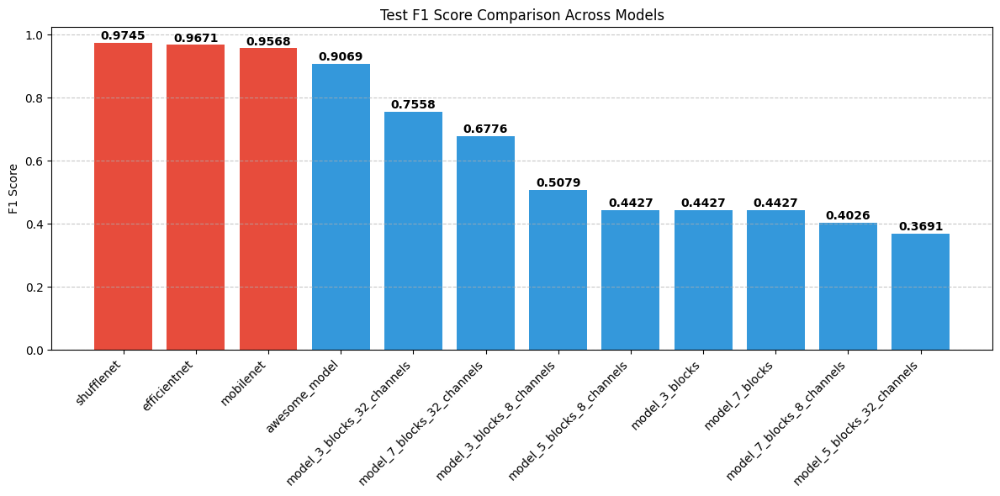

In [112]:
plt.figure(figsize=(12, 6))
models = key_metrics_df['model']
f1_scores = key_metrics_df['test_f1'].astype(float)

sort_idx = np.argsort(f1_scores)[::-1]
models = models.iloc[sort_idx]
f1_scores = f1_scores.iloc[sort_idx]

colors = ['#3498db' if 'model' in m else '#e74c3c' if 'net' in m else '#2ecc71'
          for m in models]

plt.bar(range(len(models)), f1_scores, color=colors)
plt.xticks(range(len(models)), models, rotation=45, ha='right')
plt.ylabel('F1 Score')
plt.title('Test F1 Score Comparison Across Models')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)

for i, f1 in enumerate(f1_scores):
    plt.text(i, float(f1) + 0.01, f"{float(f1):.4f}", ha='center', fontweight='bold')

plt.show()

## Vliv parametrů na přesnost


Z grafu je jasné, že předdefinované modely mají nejlepší výsledky. Nečekaně. 📈😄

Pokud se podíváme na naše modely, tak nejlepší výsledek měl model s **5 bloky** a **16 neurony**. Takhle jsme zamýšleli
používat model. Je to tedy model s defautními parametry. ✅🧩

Dobře dopadl i model s **3 bloky** a **32 neurony** a **7 bloky** a **32 neuronů**. Můžeme se podívat na matici záměn a
zjistit, zdali se netrefil do špatné třídy. 🔍📊


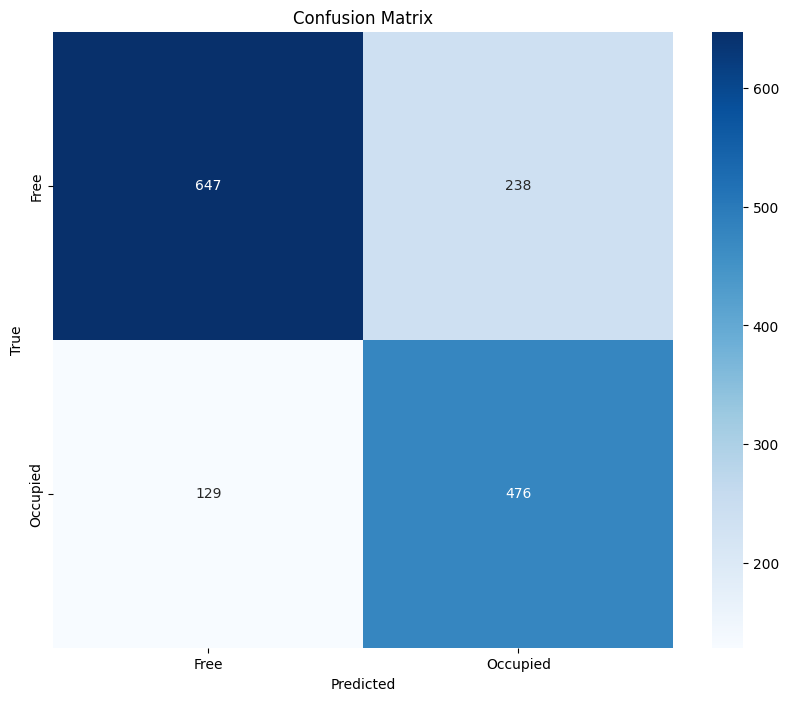

In [ ]:
metrics_3_blocks_32_channels = validate(
    model_3_blocks_32_channels,
    test_loader,
    criterion,
    device
)
plot_confusion_matrix(
    metrics_3_blocks_32_channels['labels'],
    metrics_3_blocks_32_channels['preds'],
    class_names=['Free', 'Occupied']
)

Tady vidíme, že model měl tendence predikovat obsazená místa jako volná. 🚗❌🅿️ Ale nenastalo to, že by predikoval 
jen nejpočetnější třídu.


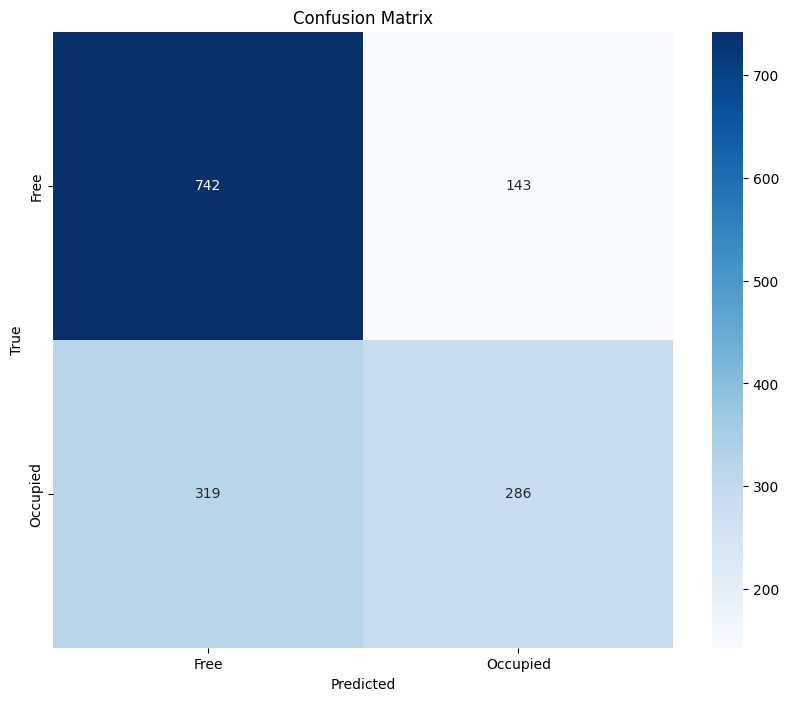

In [110]:
metrics_7_blocks_32_channels = validate(
    model_7_blocks_32_channels,
    test_loader,
    criterion,
    device
)
plot_confusion_matrix(
    metrics_7_blocks_32_channels['labels'],
    metrics_7_blocks_32_channels['preds'],
    class_names=['Free', 'Occupied']
)

Zde je situace přesně naopak. Model měl tendenci predikovat volná místa jako obsazená. 🅿️❌🚗

Potom jsou modely, které se pohybují okolo 50% přesnosti, což naznačuje, že model se nedokázal naučit extrakci těch
nejdůležitějších rysů 🤷‍♂️. Čas nám zachránilo **předčasné ukončení** trénování ⏱️🙌 , které těmto modelům nedalo ani
~10/25 epoch trénování, takže tady se to vyplatilo! 

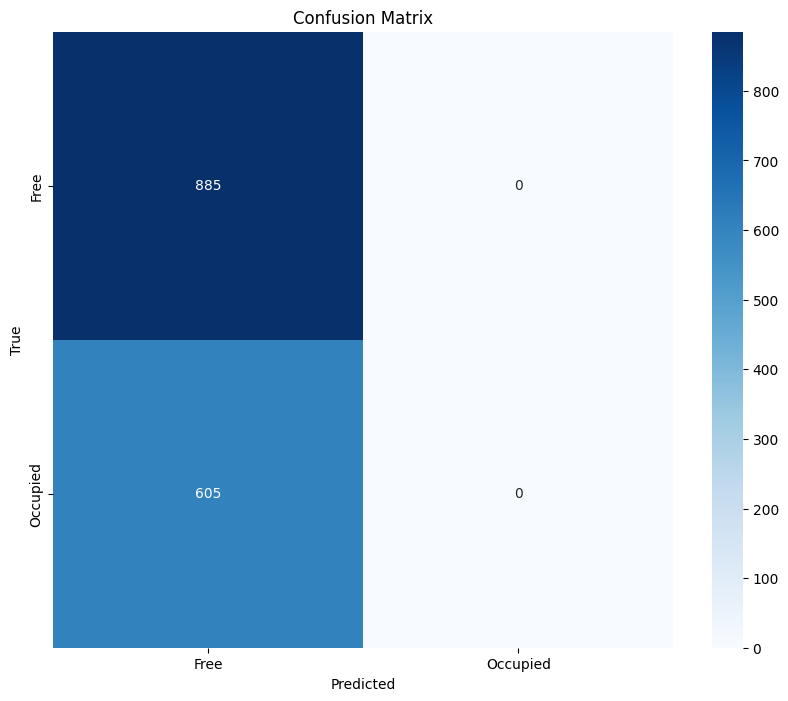

In [111]:
metrics_3_blocks = validate(
    model_3_blocks,
    test_loader,
    criterion,
    device
)
plot_confusion_matrix(
    metrics_3_blocks['labels'],
    metrics_3_blocks['preds'],
    class_names=['Free', 'Occupied']
)

## Nejlepší modely


In [115]:
key_metrics_df_top4 = key_metrics_df.head(4).copy()
key_metrics_df_top4

,model,parameters_M,test_acc,test_f1,test_precision,test_recall,epochs_trained,total_time,avg_epoch_time
0,shufflenet,1.26M,0.9745,0.9745,0.9745,0.9745,15,0:14:04,52.0501
1,efficientnet,4.01M,0.9671,0.9671,0.9671,0.9671,13,0:19:35,84.6665
2,mobilenet,2.23M,0.9570,0.9568,0.9580,0.9570,15,0:21:28,79.9541
3,awesome_model,0.53M,0.9067,0.9069,0.9072,0.9067,25,0:35:24,77.1841


- 🏆⚡🧠 Vítězem se stal model **ShuffleNet** s F1 skóre **0.9745**. Je to taky model, který má nejmenší počet
  parametrů. Je to tedy ideální model pro nasazení do reálného světa. Zároveň měl nejkratší dobu trénování a nejlepší
  výsledky. Je to tedy ideální model pro tuto problematiku.

- ⚙️⏱️📈 Za ním se umístil model **EfficientNet** s F1 skóre **0.9671**. Je to model, který má více skoro 3x více
  parametrů, než ShuffleNet. Dokázal se naučit rychleji než ostatní předdefinované modely, ale vidíme nárůst v počtu
  průměrného času trénování pro jednu epochu.

- ⚖️📊⏳ Na třetím místě se umístil model **MobileNet** s F1 skóre **0.9570**. Je to model, který má 2x více parametrů,
  než ShuffleNet. Zastavil se stejně jako ShuffleNet, ale stále má vysokou průměrnou dobu trénování pro jednu epochu.
  Proto MobileNet je kompromis mezi velikostí a rychlostí trénování.

- 🧪🔁⏱️ A na posledním místě se umístil model **MyAwesomeModel** s F1 skóre **0.9067**. V porovnání s giganty si vedl
  celkem dobře za cenu menšího počtu parametrů. Je to model, který má 0.5M parametrů, což je velmi slušné. Neustále se
  zlepšoval a nezastavil se předčasně a využil všech 25 epoch. Průměrná doba trénování je porovnatelná s MobileNetem a
  EfficientNetem, ale tím, že se předčasně nezastavil, tak trval trénovat o třetinu déle než ostatní modely.


## Vizualizace nejlepších modelů


### Matice záměn


#### ShuffleNet


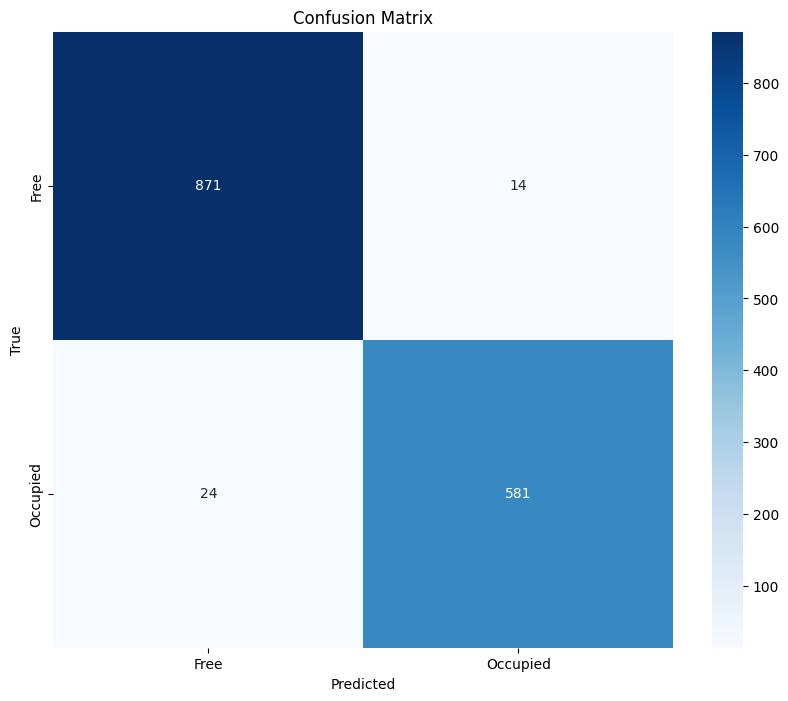

In [ ]:
best_model_metrics = validate(
    shufflenet_model,
    test_loader,
    criterion,
    device
)
plot_confusion_matrix(
    best_model_metrics['labels'],
    best_model_metrics['preds'],
    class_names=['Free', 'Occupied']
)

Skoro bezchybné 🏆🎉. Vždy se najde nějaký špatný šum, ale tohle je skvělý výsledek.


#### AwesomeModel


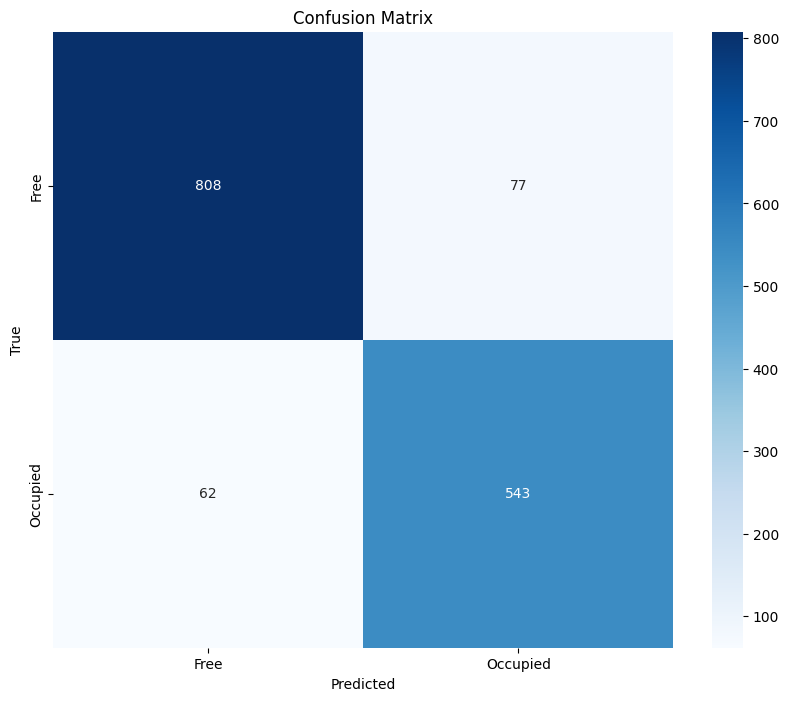

In [ ]:
awesome_model_metrics = validate(
    awesome_model,
    test_loader,
    criterion,
    device
)
plot_confusion_matrix(
    awesome_model_metrics['labels'],
    awesome_model_metrics['preds'],
    class_names=['Free', 'Occupied']
)

Sem tam nějaké odchylky, asi nedokázal správně rozeznat šum od skutečného objektu. Ale to je v pořádku. Vedli jsem si
skvěle. 🚀


### Průběh trénování


#### ShuffleNet


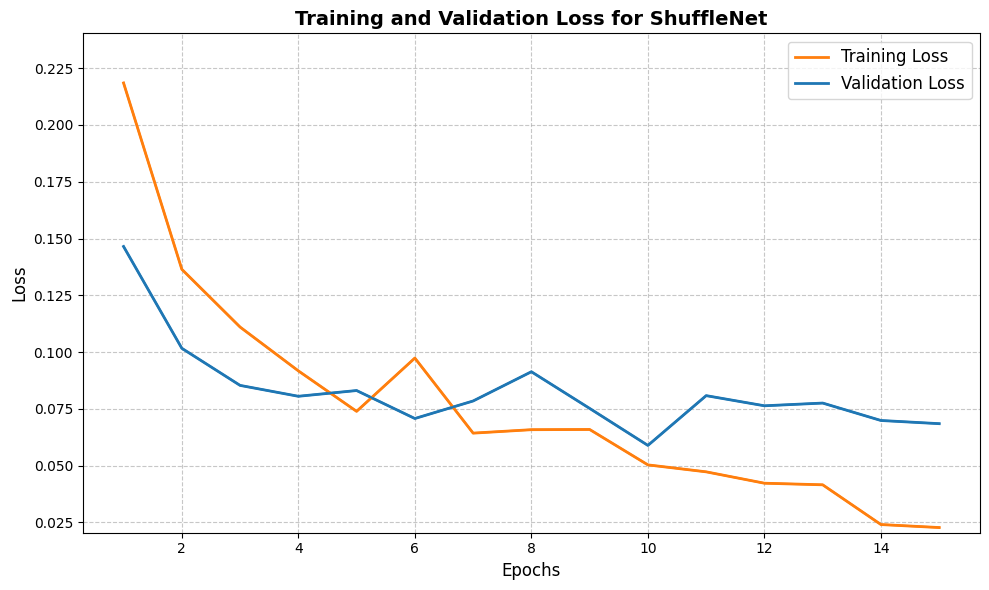

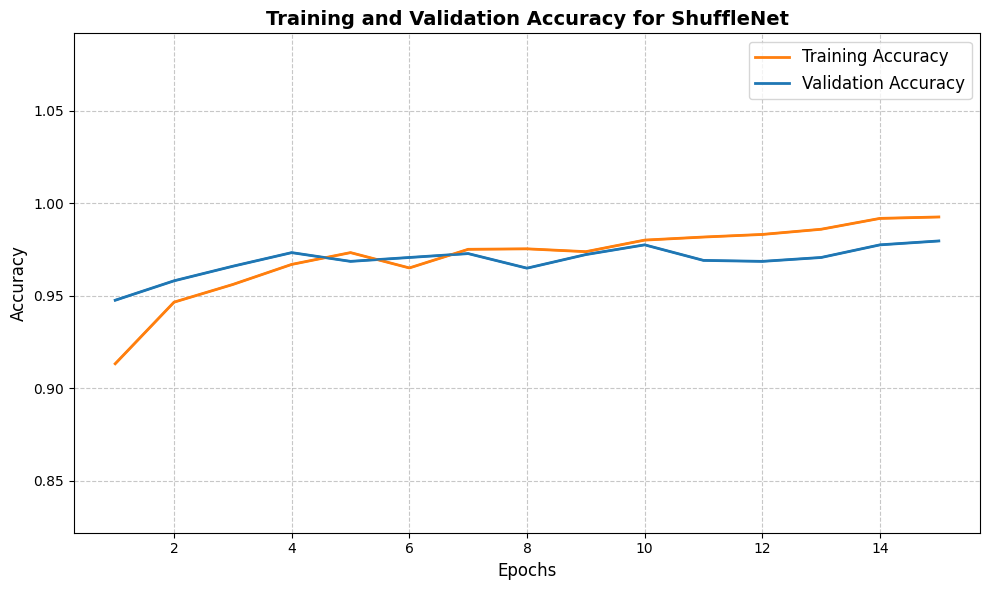

In [ ]:
plot_metrics(
    histories['shufflenet']['train_loss'],
    histories['shufflenet']['val_loss'],
    'Loss',
    'Loss',
    'Training and Validation Loss for ShuffleNet'
)
plot_metrics(
    histories['shufflenet']['train_acc'],
    histories['shufflenet']['val_acc'],
    'Accuracy',
    'Accuracy',
    'Training and Validation Accuracy for ShuffleNet'
)

#### AwesomeModel


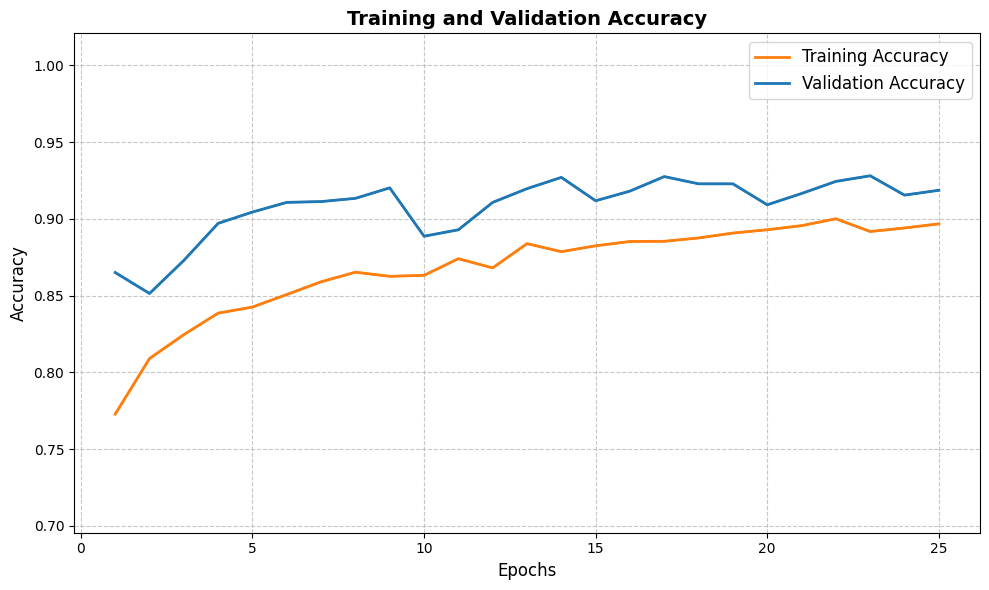

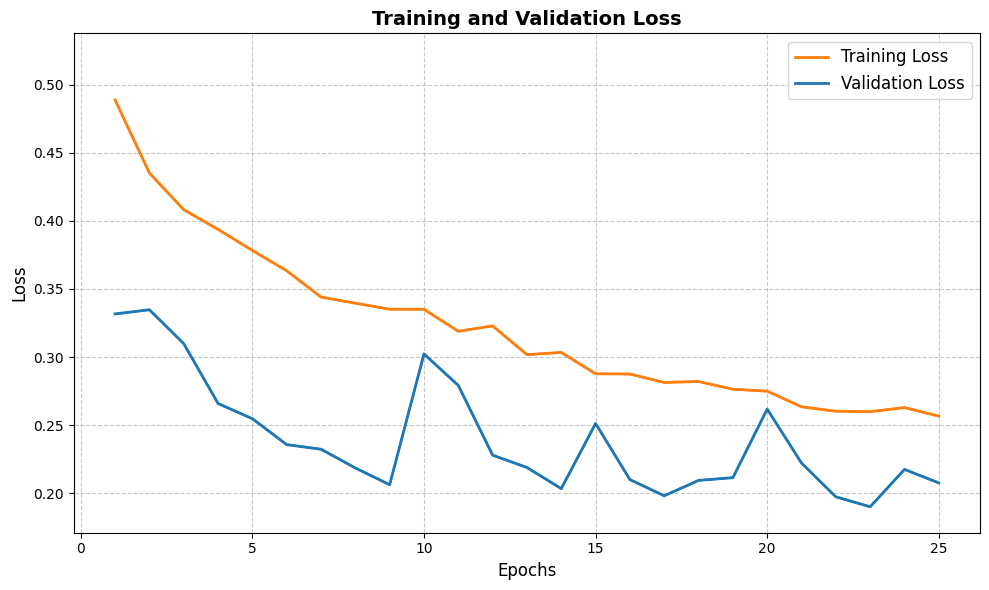

In [ ]:
plot_metrics(
    train_metrics=awesome_history['train_acc'],
    val_metrics=awesome_history['val_acc'],
    metric_name='Accuracy',
    ylabel='Accuracy',
    title='Training and Validation Accuracy'
)
plot_metrics(
    train_metrics=awesome_history['train_loss'],
    val_metrics=awesome_history['val_loss'],
    metric_name='Loss',
    ylabel='Loss',
    title='Training and Validation Loss'
)